# P3 Jupyter notebook of group Tea4Two - ADA 2023

Authors:
- Jean Lefort
- Pierre-Marie Esmenjaud
- Hugo Gérard
- Guillaume Salha
- Paul Blossier

# 0. Import librairies

In this section, we simply import and prepare the data sets, as we assume alians could do.

## 0.1. Importing the datas

In [2]:
%%capture
# Install dependencies
!{sys.executable} -m pip install -r "./_SET_UP/requirements.txt"

Import libraries.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import matplotlib as mpl
import networkx as nx
import plotly.graph_objs as go
import copy
import pandas as pd
import numpy as np
import seaborn as sn
import plotly.offline as py
import re
import math as mt

from IPython.display import Image
from wordcloud import WordCloud
from plotly.subplots import make_subplots
from IPython.display import HTML, display
from fuzzywuzzy import process
from IPython.display import Image
from wordcloud import WordCloud
from plotly.subplots import make_subplots
from scipy.signal import correlate
from scipy.signal import savgol_filter
from scipy.stats import linregress
from collections import Counter
from scipy.stats import ttest_ind
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

py.offline.init_notebook_mode(connected=True)

c:\Users\gsalh\anaconda3\envs\ada\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning:

Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning



In [4]:
# colors 
colors_hex = ["#B1740F", "#D8A245", "#FFD07B", "#FEC457", "#FDB833", "#6AADF1", "#419BF7", "#1789FC", "#0D68C5", "#02478D"]
colors_rgba = []
for color in colors_rgba:
    colors_rgba.append(tuple(int(color.lstrip('#')[i:i+2], 16)/255 for i in (0, 2, 4)) + (1,))

color_html = ""
for color in colors_hex:
    color_html += f"<div style='background-color:{color}; width: 50px; height: 20px; display: inline-block; margin-right: 5px;'></div>"

display(HTML(color_html))

Import the external functions

In [5]:
# Import external functions
from EXTERNAL_FUNCTIONS import DataImport
from EXTERNAL_FUNCTIONS import DatasetTreatment
from EXTERNAL_FUNCTIONS import NetworkPlot
from EXTERNAL_FUNCTIONS import SaveOrShowFigure
from EXTERNAL_FUNCTIONS import ScoringRelatedFunctions as srf
from EXTERNAL_FUNCTIONS import Robot_Portrait

Import the dataset MovieSummaries

In [6]:
%%capture
PATH_IN = './DATA/MovieSummaries'

# Import data
characterDF,movieDF,nameDF,plotDF,tvtropDF = DataImport.OpenMainMovieDatasetDF(PATH_IN)
movieDF = DatasetTreatment.MovieDF_Treatment(movieDF)
# Main dataframe
dataframeList = [characterDF,movieDF,nameDF,plotDF,tvtropDF]
dataframeNameList = ['characterDF','movieDF','nameDF','plotDF','tvtropDF']

In [7]:
# display dataframes of the dataset
display(characterDF.head(), 
        movieDF.head(), 
        nameDF.head(), 
        plotDF.head(), 
        tvtropDF.head())

,Wikipedia movie ID,Freebase movie ID,Movie release date,Character Name,Actor DOB,Actor gender,Actor height,Actor ethnicity,Actor Name,Actor age at movie release,Freebase character map
0,975900,/m/03vyhn,2001-08-24,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw
1,975900,/m/03vyhn,2001-08-24,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m
2,975900,/m/03vyhn,2001-08-24,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g
3,975900,/m/03vyhn,2001-08-24,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6
4,975900,/m/03vyhn,2001-08-24,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r


,Wikipedia movie ID,Freebase movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres,Freebase Language,Freebase country,Freebase genre
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,[English Language],[United States of America],"[Thriller, Science Fiction, Horror, Adventure,...",[/m/02h40lc],[/m/09c7w0],"[/m/01jfsb, /m/06n90, /m/03npn, /m/03k9fj, /m/..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,[English Language],[United States of America],"[Mystery, Biographical film, Drama, Crime Drama]",[/m/02h40lc],[/m/09c7w0],"[/m/02n4kr, /m/03bxz7, /m/07s9rl0, /m/0hj3n01]"
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,[Norwegian Language],[Norway],"[Crime Fiction, Drama]",[/m/05f_3],[/m/05b4w],"[/m/0lsxr, /m/07s9rl0]"
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,[English Language],[United Kingdom],"[Thriller, Erotic thriller, Psychological thri...",[/m/02h40lc],[/m/07ssc],"[/m/01jfsb, /m/0glj9q, /m/09blyk]"
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,[German Language],[Germany],[Drama],[/m/04306rv],[/m/0345h],[/m/07s9rl0]


,Character Name,Freebase character map
0,Stuart Little,/m/0k3w9c
1,Stuart Little,/m/0k3wcx
2,Stuart Little,/m/0k3wbn
3,John Doe,/m/0jyg35
4,John Doe,/m/0k2_zn


,Wikipedia movie ID,Plot
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha..."
1,31186339,The nation of Panem consists of a wealthy Capi...
2,20663735,Poovalli Induchoodan is sentenced for six yea...
3,2231378,"The Lemon Drop Kid , a New York City swindler,..."
4,595909,Seventh-day Adventist Church pastor Michael Ch...


,stereotype,char,movie,id,actor
0,absent_minded_professor,Professor Philip Brainard,Flubber,/m/0jy9q0,Robin Williams
1,absent_minded_professor,Professor Keenbean,Richie Rich,/m/02vchl3,Michael McShane
2,absent_minded_professor,Dr. Reinhardt Lane,The Shadow,/m/0k6fkc,Ian McKellen
3,absent_minded_professor,Dr. Harold Medford,Them!,/m/0k6_br,Edmund Gwenn
4,absent_minded_professor,Daniel Jackson,Stargate,/m/0k3rhh,James Spader


Ethnicities are only given by their FreebaseID (e.g. '/m/044038p'). We want to obtain the correspondence between this Freebase and the ethnic groups in English. This is done in the file `Ethnicity_matchning.py`. This produces the .csv file `Ethnicities.csv`, which is loaded in the following cell.

In [8]:
Ethnicity = pd.read_csv('./DATA/Ethnicities.csv')
characterDF = pd.merge(characterDF, Ethnicity, on='Actor ethnicity', how='left')
characterDF

,Wikipedia movie ID,Freebase movie ID,Movie release date,Character Name,Actor DOB,Actor gender,Actor height,Actor ethnicity,Actor Name,Actor age at movie release,Freebase character map,Ethnicity
0,975900,/m/03vyhn,2001-08-24,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,NaN
1,975900,/m/03vyhn,2001-08-24,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,NaN
2,975900,/m/03vyhn,2001-08-24,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,African Americans
3,975900,/m/03vyhn,2001-08-24,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,NaN
4,975900,/m/03vyhn,2001-08-24,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
450664,913762,/m/03pcrp,1992-05-21,Elensh,1970-05,F,NaN,NaN,Dorothy Elias-Fahn,NaN,/m/0kr406c,NaN
450665,913762,/m/03pcrp,1992-05-21,Hibiki,1965-04-12,M,NaN,NaN,Jonathan Fahn,27.0,/m/0kr405_,NaN
450666,28308153,/m/0cp05t9,1957,NaN,1941-11-18,M,1.730,/m/02w7gg,David Hemmings,15.0,/m/0g8ngmc,English people
450667,28308153,/m/0cp05t9,1957,NaN,NaN,NaN,NaN,NaN,Roberta Paterson,NaN,/m/0g8ngmj,NaN


In [9]:
# Display description of the dataframes
for df, name in zip(dataframeList, dataframeNameList):
    print(f"------------ {name} ------------")
    display(df.describe())
    print("-------------------------------------\n")

------------ characterDF ------------


,Wikipedia movie ID,Actor height,Actor age at movie release
count,4.506690e+05,154824.000000,292556.000000
mean,1.396975e+07,1.788893,37.788523
std,1.079662e+07,4.379940,20.587870
min,3.300000e+02,0.610000,-7896.000000
25%,3.759292e+06,1.676400,28.000000
50%,1.189065e+07,1.750000,36.000000
75%,2.366501e+07,1.830000,47.000000
max,3.750192e+07,510.000000,103.000000


-------------------------------------

------------ movieDF ------------


,Wikipedia movie ID,Movie box office revenue,Movie runtime
count,8.174100e+04,8.401000e+03,6.129100e+04
mean,1.740784e+07,4.799363e+07,1.118192e+02
std,1.098791e+07,1.121753e+08,4.360070e+03
min,3.300000e+02,1.000000e+04,0.000000e+00
25%,7.323695e+06,2.083193e+06,8.100000e+01
50%,1.777899e+07,1.063969e+07,9.300000e+01
75%,2.715573e+07,4.071696e+07,1.060000e+02
max,3.750192e+07,2.782275e+09,1.079281e+06


-------------------------------------

------------ nameDF ------------


,Character Name,Freebase character map
count,2666,2666
unique,970,2661
top,Daffy Duck,/m/0gcy23_
freq,42,2


-------------------------------------

------------ plotDF ------------


,Wikipedia movie ID
count,4.230300e+04
mean,1.497051e+07
std,1.111994e+07
min,3.300000e+02
25%,4.565802e+06
50%,1.284591e+07
75%,2.485168e+07
max,3.750192e+07


-------------------------------------

------------ tvtropDF ------------


,stereotype,char,movie,id,actor
count,501,501,501,501,501
unique,72,434,383,447,350
top,crazy_jealous_guy,Captain Jack Sparrow,Pirates of the Caribbean: Dead Man's Chest,/m/0k1xxm,Robert De Niro
freq,25,5,7,5,9


-------------------------------------



## 0.2. First looks at the datasets

In [10]:
# Display description of the dataframes
for df, name in zip(dataframeList, dataframeNameList):
    if name == 'plotDF':
        continue
    print(f"------------ {name} ------------")
    display(df.describe())
    print("-------------------------------------\n")

------------ characterDF ------------


,Wikipedia movie ID,Actor height,Actor age at movie release
count,4.506690e+05,154824.000000,292556.000000
mean,1.396975e+07,1.788893,37.788523
std,1.079662e+07,4.379940,20.587870
min,3.300000e+02,0.610000,-7896.000000
25%,3.759292e+06,1.676400,28.000000
50%,1.189065e+07,1.750000,36.000000
75%,2.366501e+07,1.830000,47.000000
max,3.750192e+07,510.000000,103.000000


-------------------------------------

------------ movieDF ------------


,Wikipedia movie ID,Movie box office revenue,Movie runtime
count,8.174100e+04,8.401000e+03,6.129100e+04
mean,1.740784e+07,4.799363e+07,1.118192e+02
std,1.098791e+07,1.121753e+08,4.360070e+03
min,3.300000e+02,1.000000e+04,0.000000e+00
25%,7.323695e+06,2.083193e+06,8.100000e+01
50%,1.777899e+07,1.063969e+07,9.300000e+01
75%,2.715573e+07,4.071696e+07,1.060000e+02
max,3.750192e+07,2.782275e+09,1.079281e+06


-------------------------------------

------------ nameDF ------------


,Character Name,Freebase character map
count,2666,2666
unique,970,2661
top,Daffy Duck,/m/0gcy23_
freq,42,2


-------------------------------------

------------ tvtropDF ------------


,stereotype,char,movie,id,actor
count,501,501,501,501,501
unique,72,434,383,447,350
top,crazy_jealous_guy,Captain Jack Sparrow,Pirates of the Caribbean: Dead Man's Chest,/m/0k1xxm,Robert De Niro
freq,25,5,7,5,9


-------------------------------------



In [11]:
# Check for missing values
for df, name in zip(dataframeList, dataframeNameList):
    print(f"------------ {name} ------------")
    missing_values = df.isnull().sum()
    total_values = df.shape[0]  # Total number of rows in the DataFrame

    # Calculate the percentage of missing values
    missing_percentage = (missing_values / total_values) * 100

    # Total number of values for each column
    total_column_values = df.count()

    # Display the results
    missing_info = pd.DataFrame({
        'Total Missing': missing_values,
        'Total Values': total_column_values,
        'Percentage Missing': missing_percentage,
    })

    display(missing_info)
    print("-------------------------------------\n")

------------ characterDF ------------


,Total Missing,Total Values,Percentage Missing
Wikipedia movie ID,0,450669,0.000000
Freebase movie ID,0,450669,0.000000
Movie release date,9995,440674,2.217814
Character Name,257875,192794,57.220488
Actor DOB,106145,344524,23.552763
Actor gender,45609,405060,10.120288
Actor height,295845,154824,65.645740
Actor ethnicity,344611,106058,76.466542
Actor Name,1228,449441,0.272484
Actor age at movie release,158113,292556,35.084064


-------------------------------------

------------ movieDF ------------


,Total Missing,Total Values,Percentage Missing
Wikipedia movie ID,0,81741,0.000000
Freebase movie ID,0,81741,0.000000
Movie name,0,81741,0.000000
Movie release date,6902,74839,8.443743
Movie box office revenue,73340,8401,89.722416
Movie runtime,20450,61291,25.018045
Movie languages,0,81741,0.000000
Movie countries,0,81741,0.000000
Movie genres,0,81741,0.000000
Freebase Language,0,81741,0.000000


-------------------------------------

------------ nameDF ------------


,Total Missing,Total Values,Percentage Missing
Character Name,0,2666,0.0
Freebase character map,0,2666,0.0


-------------------------------------

------------ plotDF ------------


,Total Missing,Total Values,Percentage Missing
Wikipedia movie ID,0,42303,0.0
Plot,0,42303,0.0


-------------------------------------

------------ tvtropDF ------------


,Total Missing,Total Values,Percentage Missing
stereotype,0,501,0.0
char,0,501,0.0
movie,0,501,0.0
id,0,501,0.0
actor,0,501,0.0


-------------------------------------



In [12]:
# Print column names
for df, name in zip(dataframeList, dataframeNameList):
    print(f"------------ {name} ------------")
    display(df.columns)
    print("-------------------------------------\n")

------------ characterDF ------------


Index(['Wikipedia movie ID', 'Freebase movie ID', 'Movie release date',
       'Character Name', 'Actor DOB', 'Actor gender', 'Actor height',
       'Actor ethnicity', 'Actor Name', 'Actor age at movie release',
       'Freebase character map'],
      dtype='object')

-------------------------------------

------------ movieDF ------------


Index(['Wikipedia movie ID', 'Freebase movie ID', 'Movie name',
       'Movie release date', 'Movie box office revenue', 'Movie runtime',
       'Movie languages', 'Movie countries', 'Movie genres',
       'Freebase Language', 'Freebase country', 'Freebase genre'],
      dtype='object')

-------------------------------------

------------ nameDF ------------


Index(['Character Name', 'Freebase character map'], dtype='object')

-------------------------------------

------------ plotDF ------------


Index(['Wikipedia movie ID', 'Plot'], dtype='object')

-------------------------------------

------------ tvtropDF ------------


Index(['stereotype', 'char', 'movie', 'id', 'actor'], dtype='object')

-------------------------------------



In [13]:
# Cross data frames to fill missing values
# Character Name
characterDF = DataImport.FillMissingValues(characterDF, nameDF, 'Character Name', 'Character Name','Freebase character map')

Percentage of missing values before fill : 57.22%
Percentage of missing values after fill: 57.06%
Percentage improvement: 0.16%


In [14]:
# Cross movie release date
movieDF = DataImport.FillMissingValues(movieDF, characterDF, 'Movie release date', 'Movie release date','Wikipedia movie ID')
characterDF = DataImport.FillMissingValues(characterDF, movieDF, 'Movie release date', 'Movie release date','Wikipedia movie ID')

movieDF['Movie release date'] = pd.to_datetime(movieDF['Movie release date'], format='mixed', errors='coerce',utc=True)
characterDF['Movie release date'] = pd.to_datetime(characterDF['Movie release date'], format='mixed', errors='coerce',utc=True)

# to datetime 'Actor age at movie release'in characterDF
#characterDF['Actor age at movie release'] = pd.to_datetime(characterDF['Actor DOB'], format='mixed', errors='coerce',utc=True)
display(characterDF)

Percentage of missing values before fill : 8.44%
Percentage of missing values after fill: 0.50%
Percentage improvement: 7.95%
Percentage of missing values before fill : 2.22%
Percentage of missing values after fill: 0.10%
Percentage improvement: 2.12%


,Wikipedia movie ID,Freebase movie ID,Movie release date,Character Name,Actor DOB,Actor gender,Actor height,Actor ethnicity,Actor Name,Actor age at movie release,Freebase character map,Ethnicity
0,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,NaN
1,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,NaN
2,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,African Americans
3,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,NaN
4,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
450664,913762,/m/03pcrp,1992-05-21 00:00:00+00:00,Elensh,1970-05,F,NaN,NaN,Dorothy Elias-Fahn,NaN,/m/0kr406c,NaN
450665,913762,/m/03pcrp,1992-05-21 00:00:00+00:00,Hibiki,1965-04-12,M,NaN,NaN,Jonathan Fahn,27.0,/m/0kr405_,NaN
450666,28308153,/m/0cp05t9,1957-01-01 00:00:00+00:00,NaN,1941-11-18,M,1.730,/m/02w7gg,David Hemmings,15.0,/m/0g8ngmc,English people
450667,28308153,/m/0cp05t9,1957-01-01 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,Roberta Paterson,NaN,/m/0g8ngmj,NaN


Time series of the proportion of movies released

In [15]:
Explored_movieDF = pd.DataFrame()
Explored_movieDF['Year'] = movieDF['Movie release date'].dt.year

# Calculate the quartiles
quartiles = Explored_movieDF['Year'].dropna().quantile([0.25, 0.5, 0.75])
year_intervals = [Explored_movieDF['Year'].min(), quartiles[0.25], quartiles[0.5], quartiles[0.75], Explored_movieDF['Year'].max()]
quartile_labels = [str(int(year_intervals[i])) + ' - ' + str(int(year_intervals[i + 1])) for i in range(len(year_intervals) - 1)]
Explored_movieDF['Year Interval'] = pd.cut(Explored_movieDF['Year'], bins=year_intervals, labels=quartile_labels)
Explored_movieDF['Year Interval'] = Explored_movieDF['Year Interval'].cat.add_categories(['No release date'])
Explored_movieDF['Year Interval'].fillna('No release date', inplace=True)
# Count the percentage of movies in each interval
year_interval_counts = Explored_movieDF['Year Interval'].value_counts(normalize=True) * 100
year_interval_counts = year_interval_counts.sort_index()
year_interval_counts = year_interval_counts.reset_index()
Explored_movieDF = year_interval_counts
# round to 2 decimals, str and add %
Explored_movieDF['proportion'] = Explored_movieDF['proportion'].apply(lambda x: str(round(x, 1)) + '%')

display(Explored_movieDF)

,Year Interval,proportion
0,1888 - 1957,25.6%
1,1957 - 1986,24.6%
2,1986 - 2004,26.5%
3,2004 - 2016,22.8%
4,No release date,0.5%


# 1. Building a ‘robot portrait’ of human beings thanks to the CMU dataset, and comparing it to reality

In the first part of this work, we are trying to build the description of an average human based on the data extracted from the dataset. We are taking the point of view of the aliens and we are wondering what a typical human looked like. We will start by basic consideration such as gender, age, heigth, ethinicity and we will then try to describe the tate of the humans for specific movie genres. 

The driving question for this part : How does an average modern human look like ? 

## 1.1. Basic considerations (age, height, ethnicity, gender)

### 1.1.1. Gender

We start by looking at the gender, the dataset categorizes the hender in two different categories : 'M' and 'F'. Is one of those two catagories more represented than the other ? 
We assume that a female character is always played by an actress, and vice versa. 


In [16]:
# Assuming gender_counts is a pandas Series
gender_counts = characterDF.dropna(subset='Character Name')['Actor gender'].value_counts()

# Create a DataFrame from the gender_counts Series
gender_df = pd.DataFrame({'gender': gender_counts.index, 'count': gender_counts.values})

# Map the original labels to the desired labels
label_mapping = {'M': 'Male', 'F': 'Female'}
gender_df['gender'] = gender_df['gender'].map(label_mapping)

# Plot the pie chart using Plotly Express
fig = px.pie(gender_df, names='gender', values='count', 
             title='Character Gender',
             labels={'gender': 'Gender', 'count': 'Count'},
              color_discrete_sequence=['#87CEEB', '#FF0000'])

# Show the plot
fig.show()
SaveOrShowFigure.export_plots(fig, 'gender_distribution')

In [17]:
print(f"There is around {round((gender_counts['M']/gender_counts['F'] -1)*100, 1)} % more male-charactors than female-charactors.")

There is around 82.0 % more male-charactors than female-charactors.


The previous graph shows that, in this data set, genders are poorly balanced. In the synopsis of Earth legacy, this could lead to a serious bias (naive aliens will think there are about twice as many men as women on Earth, because men are over-represented).

Let's dig a bit more into this gender-difference. Let's do it over time.

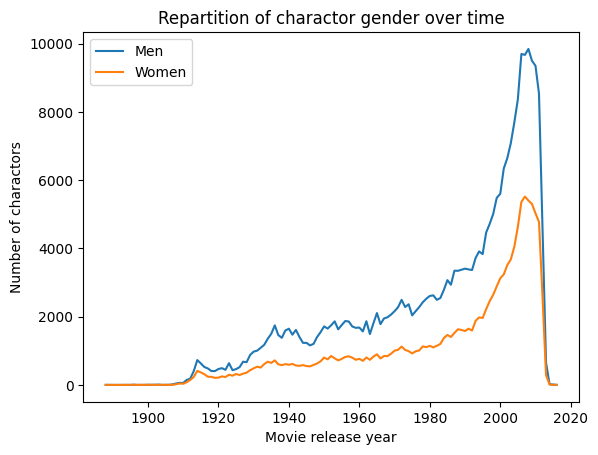

In [18]:
Gender_birth = characterDF[['Actor Name', 'Actor gender', 'Movie release date']].copy(deep=True)

#Create a new column with the Movie_release year 
Gender_birth['Movie release year'] = Gender_birth['Movie release date'].dt.year

Women = Gender_birth.loc[Gender_birth['Actor gender'] == 'F']
Men = Gender_birth.loc[Gender_birth['Actor gender'] == 'M']
Women = Women.groupby('Movie release year').count()
Men = Men.groupby('Movie release year').count()

plt.plot(Men.index,Men['Actor Name'],label = 'Men')
plt.plot(Women.index,Women['Actor Name'],label = 'Women')
plt.xlabel('Movie release year')
plt.ylabel('Number of charactors')
plt.title('Repartition of charactor gender over time') 
plt.legend()
plt.show()

Please note that the sudden fall of the curves after 2012 is due to the fact that we don't have any movie after this date. Alians will still have the same impression, year after year. What to say about the relative difference between female and male character roles?  

In [19]:
# Calculate the ratio for each year
ratio = [(Men.loc[k, 'Actor Name'] / Women.loc[k, 'Actor Name']) for k in range(1910, 2012)]

# Create a DataFrame for the plot
df = pd.DataFrame({'Year': np.arange(1910, 2012), 'Ratio': ratio})

# Line plot with a horizontal line at y=1 
fig = px.line(df, x='Year', y='Ratio', title='Evolution of gender distribution across time\n(parity in red)',
              line_shape='linear', hover_data={'Ratio': ':.2f'})
fig.add_shape(type='line', x0=df['Year'].min(), x1=df['Year'].max(), y0=1, y1=1,
              line=dict(color='red', dash='dash'),
              name='Parity')
fig.update_layout(
    xaxis_title='Movie Release Year',
    yaxis_title='Ratio (n.o. males / n.o. females)',
    showlegend=True,
    title_font=dict(size=14)  # Adjust the font size as desired
)
fig.show()
SaveOrShowFigure.export_plots(fig, 'evolution_gender_distribution')

First, we see that the repartition is clearly unbalanced at all times.

We see that, at its peak, there were 2.75 times more men characters in the movies than woman characters. The situation is slowly getting better over time, but there were still, in 2012, 1.79 times more men characters than women ones. At this speed we cannot expect to reach parity before 2100. 

Aliens can directly see from this graph that the human society is deeply unqual, indeed, if there was only less women than men they should observe a relatively constant parity ratio. This evolution through times tells that the difference in proportion between men and women doesn't seem to be the only factor influencing gender representation. 


There is no longer any hope: gender repartition is strongly unbalanced, even in relative scale. 

### 1.1.2. AGE


Let's investigate life expectancy of humans and at what age there are at the peak of their carrer. 

Question : how long humans lived ?

In [20]:
#We build the agedf dataset that we will use for our investigations 
ageDF = characterDF[['Actor Name', 'Actor gender', 'Actor age at movie release']]
ageDF = ageDF.drop_duplicates()
ageDF = ageDF.dropna()
ageDF['Actor age at movie release'] = ageDF['Actor age at movie release'].astype('int')
#We remove abherent data 
ageDF = ageDF[ageDF['Actor age at movie release']>= 0]

#We compute the statistical indicators 
q1 = ageDF['Actor age at movie release'].quantile(0.25)
q2 = ageDF['Actor age at movie release'].quantile(0.5)
q3 = ageDF['Actor age at movie release'].quantile(0.75)
mean_age = ageDF['Actor age at movie release'].mean()

#We plot the age distribution at movie release 
fig = px.histogram(ageDF, x='Actor age at movie release', nbins=100, opacity=0.7,
                   title='Histogram of Actor age at the movie realase',
                   labels={'Age': 'Age', 'count': 'Frequency'})


fig.add_shape(type='line', x0=mean_age, x1=mean_age, y0=0, y1=15000, line=dict(color='red', width=2), name='Mean')
fig.add_shape(type='line', x0=q1, x1=q1, y0=0, y1=15000, line=dict(color='orange', width=2), name='Q1 (25%)')
fig.add_shape(type='line', x0=q2, x1=q2, y0=0, y1=15000, line=dict(color='green', width=2), name='Q2 (50%)')
fig.add_shape(type='line', x0=q3, x1=q3, y0=0, y1=15000, line=dict(color='purple', width=2), name='Q3 (75%)')


#fig.update_layout(annotations=[
 #   dict(x=mean_age, y=0, xref='x', yref='y', text='Mean', showarrow=True, arrowhead=4, ax=10, ay=-40),
  #  dict(x=q1, y=15000, xref='x', yref='y', text='Q1 (25%)', showarrow=True, arrowhead=4, ax=0, ay=-40),
   # dict(x=q2, y=15000, xref='x', yref='y', text='Q2 (50%)', showarrow=True, arrowhead=4, ax=0, ay=-40),
    #dict(x=q3, y=15000, xref='x', yref='y', text='Q3 (75%)', showarrow=True, arrowhead=4, ax=0, ay=-40)
#])


fig.update_layout(width=600, height=400)
fig.add_annotation(
    x=1,
    y=1,
    xref='paper',
    yref='paper',
    text=f"Mean: {mean_age:.2f}<br>Q1: {q1:.2f}<br>Q2: {q2:.2f}<br>Q3: {q3:.2f}",
    showarrow=False,
    align='left',
    font=dict(size=10),
    bgcolor='rgba(255, 255, 255, 0.8)',
    bordercolor='rgba(0, 0, 0, 0.8)',
    borderwidth=1
)

fig.update_layout(showlegend=True)
fig.show()

print(ageDF.describe())


       Actor age at movie release
count               207928.000000
mean                    37.946842
std                     14.380399
min                      0.000000
25%                     28.000000
50%                     36.000000
75%                     47.000000
max                    103.000000


The ages ranges from 0 to 103 years old. This already tells us that human life expectancy is probabliy lower than 100 years. 50% of the actors are between 28 and 47 years old when they play in movies. This looks like the age range at which humans are the most productive. We also note that the distribution have a sudden increase around 20 years, this is the moment when humans have finished their developement and are ready to enter into working life. The tail of the distribution is much smoother so there doeasn't seem to be a moment at which everyone retires. 

Let's now have a look at differences between men and women 

In [21]:
Men_med = ageDF[ageDF['Actor gender']=='M']['Actor age at movie release'].quantile(0.5)
Women_med = ageDF[ageDF['Actor gender']=='F']['Actor age at movie release'].quantile(0.5)

# Create histogram traces
Men_hist = go.Histogram(x=ageDF[ageDF['Actor gender']=='M']['Actor age at movie release'], opacity=1, name="Men's age repartition",marker_color = '#87CEEB', nbinsx=100)
Women_hist = go.Histogram(x=ageDF[ageDF['Actor gender']=='F']['Actor age at movie release'], opacity=1, name="Women's age repartition",marker_color = "#FF0000", nbinsx=100)
Tot_hist = go.Histogram(x=ageDF['Actor age at movie release'], opacity=0.7, name='Global repartition',marker_color = "#FFD07B", nbinsx=100)
Men_med_line = go.Scatter(x=[Men_med, Men_med], y=[0, 13000], mode='lines', line=dict(color="#02478D", dash='dash'), name='Median age for men')
Women_med_line = go.Scatter(x=[Women_med, Women_med], y=[0, 13000], mode='lines', line=dict(color='#800000', dash='dash'), name='Median age for women')

# Create layout
layout = go.Layout(title="Actor's age repartition at movie release", barmode='overlay', xaxis=dict(title="Actor's age"), yaxis=dict(title="Count"))

# Create figure
fig = go.Figure(data=[Tot_hist,Men_hist, Women_hist,Men_med_line,Women_med_line], layout=layout)


fig.add_annotation(
    x=1,
    y=1,
    xref='paper',
    yref='paper',
    text=f"Madian age for men: {Men_med:.2f}<br>Median age for women: {Women_med:.2f}",
    showarrow=False,
    align='left',
    font=dict(size=10),
    bgcolor='rgba(255, 255, 255, 0.8)',
    bordercolor='rgba(0, 0, 0, 0.8)',
    borderwidth=1
)

fig.update_layout(width=800, height=800)
fig.update_layout(showlegend=True)
# Show the plot

fig.show()
SaveOrShowFigure.export_plots(fig, 'age_repartition_global_HF')

We observe indeed a big difference between men and women ages. Looking at this, aliens could think that women have a lower life expectancy than men, it would be coherent with their previous reults which seemed to indicate that there were more men than women. The difference in average is very significative, it's 7 years. 

This result is very intersting because it doeasn't reflect at all the reality, for instance, in the US life expectancy of women is in average 5 years higher than the one of men. This repartition indicates that women are displayed in movies much younger than men, we also notice that they stop playing in movie much earlier than men, the tail of the distribution is squeezed. 

### 1.1.3. Heigth

Aliens interset now themselves to the physical looking of humans. What was their height ? Were they giants or rather dwarfs ? 

In [22]:
actorDF = characterDF[['Actor Name', 'Actor gender', 'Actor height']]
actorDF = actorDF.drop_duplicates()
actorDF = actorDF.dropna()

# Remove any missing or NaN values from the 'Actor height (in meters)' column
min_height = 0.5
max_height = 2.5
N_boundaries = 40
heights_men = actorDF[(actorDF['Actor height'] > min_height) & \
                      (actorDF['Actor height'] < max_height) & \
                      (actorDF['Actor gender'] == 'M')]\
                ['Actor height'].copy()
heights_women = actorDF[(actorDF['Actor height'] > min_height) & \
                        (actorDF['Actor height'] < max_height) & \
                        (actorDF['Actor gender'] == 'F')]\
                ['Actor height'].copy()
bin_boundaries = np.linspace(min_height, max_height, num=N_boundaries)

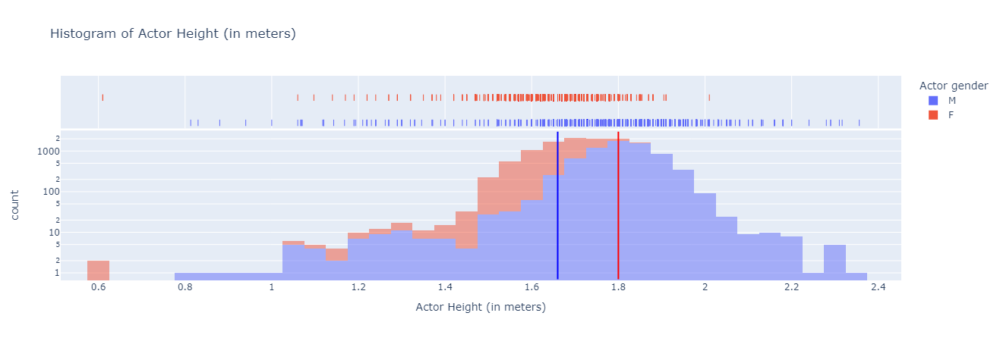

In [23]:
Image(filename='./IMAGES/png/actors_height.png')


The repartition of height of humans seems to follow more or less a gaussian distribution. Humans are no taller than 2.25 expect for some outliers. Their mean height is 1.73m but there are strong discrepencies between men and women. Men have an average height of 1m80 and women an average height of 1m65. 

### 1.1.3. Ethnicity

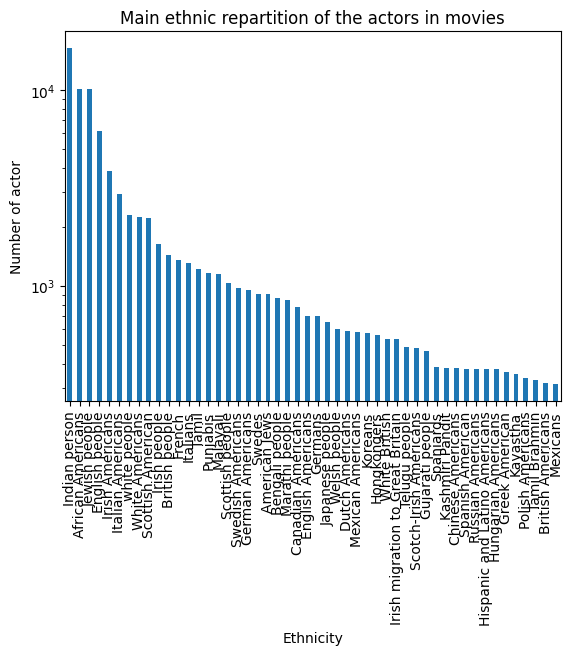

In [24]:
### bar chart
nb_ethnicity = characterDF['Ethnicity'].value_counts()
nb_ethnicity_main = nb_ethnicity[0:50]
nb_ethnicity_main.plot(kind = 'bar')
plt.ylabel('Number of actor') 
plt.title('Main ethnic repartition of the actors in movies')
plt.yscale('log')
plt.show()


### pie chart
limit_percentage = 1.25 # limit above which we merge all the values
total_count = sum(nb_ethnicity)
limit_value = total_count * (limit_percentage / 100)
merged_value = sum( value for value in nb_ethnicity.values if value < limit_value )

# Create a dictionary with merged values
merged_ranks_freq = {ethincity: nb_ethnicity[ethincity] for ethincity in nb_ethnicity.keys() if nb_ethnicity[ethincity] >= limit_value}
merged_ranks_freq['Other'] = merged_value

# Extract keys (ranks) and values (frequencies) for plotting
ranks = list(merged_ranks_freq.keys())
values = list(merged_ranks_freq.values())

# pie chart
# Create a pie chart using Plotly Express
fig = px.pie(names=ranks, values=values, title='Ethnicity repartition',labels =ranks)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(width=900, height=800)
fig.update_layout(showlegend=True)
# Show the plot

fig.show()
SaveOrShowFigure.export_plots(fig, name='ethnicity_repartition')

The first thing that can be criticised about our classification of ethnicities is the very narrow definition of each category (e.g Irish Americans and Italian Americans). This prevents us from grasping the global trend for ethnicity repartition over the population. A great deal of work would be needed to group similar classes together in order to have a more global and faithful view of reality. 

We can still conduct premilinary anlysis and say several things : 

    - Humans are split into a lot of small categories, there is a huge diversity among humans 

    - 'Indian' is the most represented ethnicity 
    
    - If aggregated, occidental white people would be the biggest category. 



Again, this gives a higly biased vsion of reality in which 70% of the world population is either Asian or African. 

### 1.1.3. Country of origin

Let's have a look at the country of origin of the different movies. Can we use this data to approximate the repartition of population in the world ? 

In [25]:
#We create a new dataframe to conduct our analysis 
countries = movieDF.copy(deep=True).explode('Movie countries')
countries= countries.dropna(subset = ['Movie countries'])
countries =countries['Movie countries'].value_counts()
#We count how many times each country is represented 
countries = pd.DataFrame({'Country_name' : countries.index,'Count': countries.values})
countries = countries[countries['Count']>5]

In [26]:
#Let's plot this on a map of the world.
#To do so we use the csv file fownloaded from : 'https://raw.githubusercontent.com/plotly/datasets/master/gapminder_with_codes.csv'
#in order to have the correspondance between the country name and it's iso_alpha to locate it on the map 

#The probelem, however is that there is a lack of consistency between the names of the countries in both dataset. 
#We proceed to an approximate matching using the libarry fuzzywuzzy in order to overcome this problem 

PATH_DATA_COUNTRIES = './DATA/AddedDatasets/data_countries.csv'
data = pd.read_csv(PATH_DATA_COUNTRIES)

def fuzzy_match(name, choices):
    '''
    Given a string 'name' and a list of strings : choices. it returns the closest match of name in the list choices 
    '''

    match, score, index = process.extractOne(name, choices)
    if score >= 90 : 
        return match

#We want to match the country names from our dataframe country and the one used in the dataframe data used to plot the map 
countries['country'] = countries['Country_name'].apply(lambda x : fuzzy_match(x,data['country']))

merged_df = pd.merge(data,countries, on = 'country')
merged_df['log_count'] = np.log10(merged_df['Count'])

In [27]:
# Create basic choropleth map
fig = px.choropleth(merged_df, locations='iso_alpha', color='log_count', hover_name='country',
                    projection='natural earth', title='Number of movies produces by each country (log scale)')

fig.update_layout(width=800, height=500)
fig.show()
#please note that the colorscale is in log scale 

### 1.1.5. Language spoken 

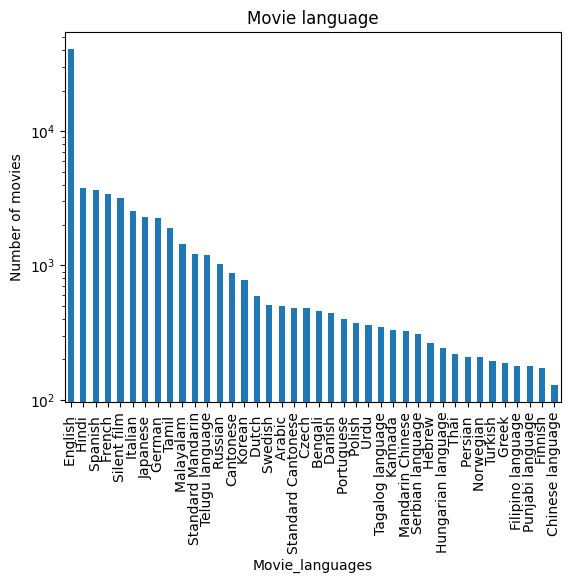

In [28]:
#First let's investigate the repartition of the different movie langauges 
language_df = movieDF.copy(deep = True).dropna(subset = ['Movie languages'])
language_df = language_df.explode('Movie languages')
language_df = language_df.rename(columns = {'Movie languages':'Movie_languages'}) 

language_df['Movie_languages'] = language_df['Movie_languages'].str.replace('Language','')


lgg = language_df['Movie_languages'].value_counts()

lgg.head(40).plot(kind = 'bar')
plt.title('Movie language')
plt.ylabel('Number of movies')
plt.yscale('log')
plt.show()

The conclusion here is crystal clear : Humans speak mostly english. 

Based on this, we note that the most spoken languages are in order : English, Hindi, Spanish, French. This is not very far from the actual language repartition which is (1) English, (2) Mandarin, (3) Hindi, (4) Spanish and (5) French [Source](https://fr.statista.com/statistiques/565467/langues-les-plus-parlees-dans-le-monde/). We note that Mandarin is splitted in different categories : 'Standard Mandarin','Mandarin Chinese','Chinese language' we explains why is not well accounted for.


This first analyse is not enough, we could imagine a situation where we have an over representation of movies from a small country in our dataset. To overcome this issue, we will compute the linear regression of the movie sucess as a function of language. This will tell us if making a movie in a specific language could induce more viewers and hence traduce the fact that the language is spoken by more people



## 1.2 Human's tastes 

After analysing these basic characteristics, we want to dig further. Aliens want to understand what modern humans liked, to what were they sensible to. What brings sucess to a movie ? 

### 1.2.1 Methodology

Let's make a small break in our analysis and let's build an indicator of a movie sucess. The only information we have to quantify the sucess of a movie is the movie box office revenue. Let's start by looking if it's a good metric or not. 

In [29]:
# We build a new dataframe to work with 
Sucess_df = movieDF.copy(deep = True).dropna(subset=["Movie box office revenue",'Movie release date'])
Sucess_df['Movie_release_year'] = Sucess_df['Movie release date'].dt.year
Sucess_df = Sucess_df.rename(columns = {'Movie box office revenue':'Movie_box_office_revenue'}) 

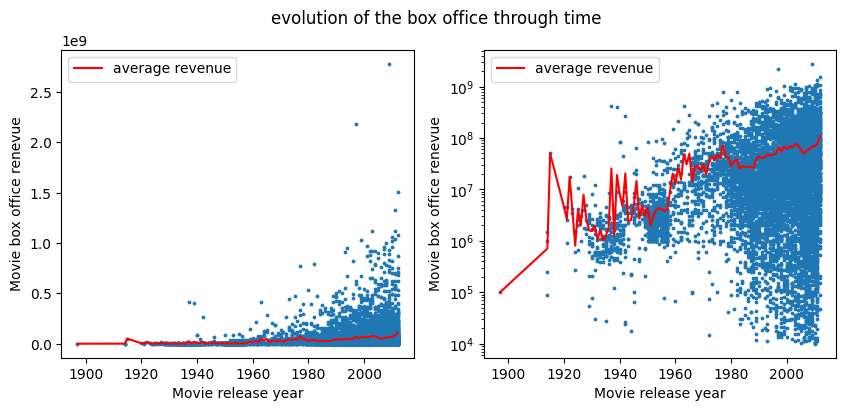

In [30]:
#Let's compute the average revenue by year 
Year_average = Sucess_df[['Movie_release_year','Movie_box_office_revenue']].groupby(by = 'Movie_release_year').mean()

#Let's plot the box office by year 
fig, (ax1, ax2) = plt.subplots(1, 2,figsize = (10,4))
ax1.scatter(Sucess_df['Movie_release_year'],Sucess_df['Movie_box_office_revenue'],s=3)
ax1.plot(Year_average.index,Year_average['Movie_box_office_revenue'],color = 'r',label = 'average revenue')
ax2.scatter(Sucess_df['Movie_release_year'],Sucess_df['Movie_box_office_revenue'],s=3)
ax2.plot(Year_average.index,Year_average['Movie_box_office_revenue'],color = 'r',label = 'average revenue')
ax1.set_xlabel('Movie release year')
ax1.set_ylabel('Movie box office renevue')
ax2.set_xlabel('Movie release year')
ax2.set_ylabel('Movie box office renevue')
fig.suptitle('evolution of the box office through time')
ax2.set_yscale('log')
ax2.legend()
ax1.legend()

#The problen is that it seems that the box office revenue is primarly influenced by the movie release year 

We observe that the variable Movie_box_office_revenue has a wide range of variability, and this range extends over time. Morover, we observe that the average revenue seems to grow over time. Let's look in more detail at trying to quantify the impact of a film's year of release on its success. 

                               OLS Regression Results                               
Dep. Variable:     Movie_box_office_revenue   R-squared:                       0.034
Model:                                  OLS   Adj. R-squared:                  0.034
Method:                       Least Squares   F-statistic:                     297.2
Date:                      Sun, 28 Apr 2024   Prob (F-statistic):           1.75e-65
Time:                              11:02:38   Log-Likelihood:            -1.6747e+05
No. Observations:                      8400   AIC:                         3.349e+05
Df Residuals:                          8398   BIC:                         3.350e+05
Df Model:                                 1                                         
Covariance Type:                  nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

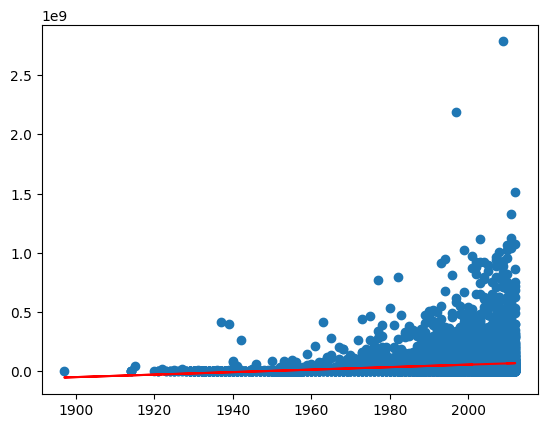

In [31]:
#Let's see if it's indeed the case 
import statsmodels.formula.api as smf


model_1 = smf.ols(' Movie_box_office_revenue ~ Movie_release_year',Sucess_df)
results_1 = model_1.fit()
print(results_1.summary())

plt.scatter(Sucess_df['Movie_release_year'],Sucess_df['Movie_box_office_revenue'])
print(len(results_1.predict()))
plt.plot(Sucess_df['Movie_release_year'],results_1.predict(),color = 'r',label = 'Linear Regression')


Our first concern is verified. The movie box office revenue is indeed incresing over time at a rate of 1 million US$ per year. This coefficient is associated with a very low p-value meaning that it's very relevant. This could be explained by several things : 

-   Inflation, the movie box office revenue is not expressed in constant US$ and it would need to be corrected for inflation if we want to compare two movies from different periods 
-   In the past, the movie industry was much smaller, there were fewer cinemas and the audience was much smaller than it is today. The box office reveneue were mecanically lower even if the film was a succes. 

In  our study we are not interested in the influence of the release year on the sucess of the movie but rather on the impact of the genre, the language, ... In order to understand the factors which drive sucess, we want to compare movies with each other and we are not really interested in the absolute succes of a particular movie. 

Furthermore, the aliens don't have acess to the inflation data so it would not be fair to correct for it. Considering all of that we are going to correct for the influence of the realease year by normalizing the Movie_box_office_revenue for each of the realease year independently. By doing so, we are considering that the reparttion of the success is independant of the release year and we are correcting for the evolution of the movie industrty. 

We are standardizing our data because this rescaling method is more robust to outliers than the min-max rescaling.  

In [32]:
#We are using the preprocessing tool from sklearn 
from sklearn.preprocessing import StandardScaler
Sucess_df = Sucess_df.sort_values('Movie_release_year')

#List of release year present in our dataset 
years = Sucess_df['Movie_release_year'].drop_duplicates()

#We create a new column to store the scaled box office revenue 
Sucess_df['Movie_box_office_revenue_scaled'] = Sucess_df['Movie_box_office_revenue']
scaled = []

for yr in years : 
    #Here we rescale independently all the years, we do so because we want to remove the influence of the year realse date in the movie sucess 
    scaler = StandardScaler()
    Sucess_df.loc[Sucess_df['Movie_release_year'] == yr,'Movie_box_office_revenue_scaled'] = scaler.fit_transform(Sucess_df[Sucess_df['Movie_release_year'] == yr]['Movie_box_office_revenue'].values.reshape(-1, 1))


                                   OLS Regression Results                                  
Dep. Variable:     Movie_box_office_revenue_scaled   R-squared:                       0.000
Model:                                         OLS   Adj. R-squared:                 -0.000
Method:                              Least Squares   F-statistic:                     0.000
Date:                             Sun, 28 Apr 2024   Prob (F-statistic):               1.00
Time:                                     11:02:39   Log-Likelihood:                -11917.
No. Observations:                             8400   AIC:                         2.384e+04
Df Residuals:                                 8398   BIC:                         2.385e+04
Df Model:                                        1                                         
Covariance Type:                         nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      

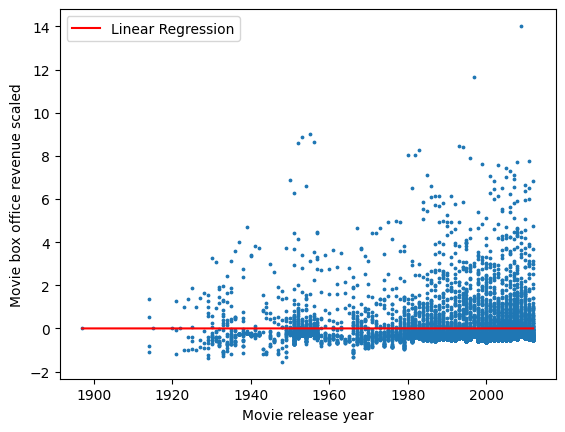

In [33]:
#Let's check that we indeed corrected for the influence of the realease year 

model_2 = smf.ols(' Movie_box_office_revenue_scaled ~ Movie_release_year',Sucess_df)
results_2 = model_2.fit()
print(results_2.summary())

plt.scatter(Sucess_df['Movie_release_year'],Sucess_df['Movie_box_office_revenue_scaled'],s = 3)
print(len(results_1.predict()))
plt.plot(Sucess_df['Movie_release_year'],results_2.predict(),color = 'r',label = 'Linear Regression')
plt.xlabel('Movie release year')
plt.ylabel('Movie box office revenue scaled')
plt.legend()


By doing the regression we indeed observe that Movie_box_office_revenue_scaled is independant of the release year with a p-value of 1. We are going to use this metric in the following parts to asses the sucess of a particular movie.

### 1.2.2 Movie genres
In this part we are wondering which are the movie genres prefered by modern humans. What are the things people want to watch ? 

In [34]:
# We create a copy of our movie dataframe on which we are going to work 
Type_df = Sucess_df.copy(deep = True).dropna(subset = ['Movie genres'])
Type_df = Type_df.rename(columns = {'Movie genres':'Movie_genres'})

Please note that if a movie have several genres which is often the case in the datatset it's counted as many times as it has genres. Let's start by looking at which movie genres are present in our dataset. 

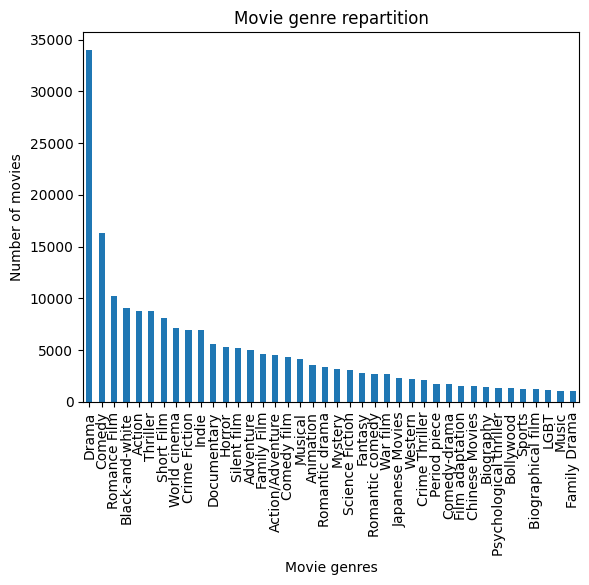

In [35]:
#What genres are the most represented in our moviedf dataset 
#One movie can be associated with several movie genres, we explode the dataset in order to have one genre per row. 
genres = movieDF.explode('Movie genres')
Genre = genres['Movie genres'].value_counts()

Genre.head(40).plot(kind = 'bar')
#plt.pie(Genre[0:10],labels = Genre[0:10].index,autopct='%1.1f%%', startangle=90)
plt.title('Movie genre repartition')
plt.ylabel('Number of movies')
plt.show()


The three most represented genre in our datasets are : Drama, Comedy and Romance. 
Let's now have a look the repartition of genres in the most sucessful movies. 

In [36]:
#We keep here only the most sucessfull 1000 movies 
Best_Movies = Type_df.sort_values(by = 'Movie_box_office_revenue_scaled', ascending = True).tail(1000)
Best_Movies = Best_Movies.explode('Movie_genres')
Best_Movies_genre = Best_Movies['Movie_genres'].value_counts()

In [37]:
Best_Movies_genre= Best_Movies_genre.head(40)
fig = px.bar(Best_Movies_genre, x=Best_Movies_genre.index, y='count', title='Genres repartition in the 1000 most sucessful movies')
fig.show()
SaveOrShowFigure.export_plots(fig,'genre_top_1000')

Movie genres repartition in the 1000 most sucessful movie looks very similar to the one of the full dataset: Drama, Comedy and Roamance are still trusting the top positions. We cannot really conclude anything from this, we don't know if Drama is indeed bringing sucess or if it's something else. 

We will continue our investigation by doing linear regressions in order to asses how the movie box office revenue scaled is influenced or not by a choice of a particular genre. In our linear regression we are choosing a reference genre to which we are going to compare all the others. Because Drame is the most represented genre in our dataset, we will take it as a reference. The coefficient we are going to obtain can be interpreted as a measure of the comparative performance of the considered genre compared to Drama. If the coefficient of 'Sports' for example is 0.5 then it means that doing a Sport movie rather than a Drama movie will in average result in a movie 0.5 times more profitable.  

For the following anlaysis we will focus on the most important genres(i.e genres representing at least 100 movies each)

In [38]:
Type_df = Type_df.explode('Movie_genres')
Genres_list = Type_df['Movie_genres'].value_counts().sort_values(ascending = False)


#Let's extract the list of Genres which describes more than 100 movies 
treshold = 100

i = 0
for elem in Genre : 
    i+= 1
    if elem<= treshold : 
        break 

#List of genres representing more than 100 movies each 
Important_Genres = Genres_list.index.tolist()[0:i]


In [39]:
# We filter our dataset to keep only the movies of intetrest 
reg_data = Type_df[Type_df['Movie_genres'].isin(Important_Genres)]
#We compute the linear regression to compare one genre to all the others, it will give us 
Genre_reg = smf.ols(formula='Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Drama"))', data=reg_data).fit() 
#print(Genre_reg.summary())

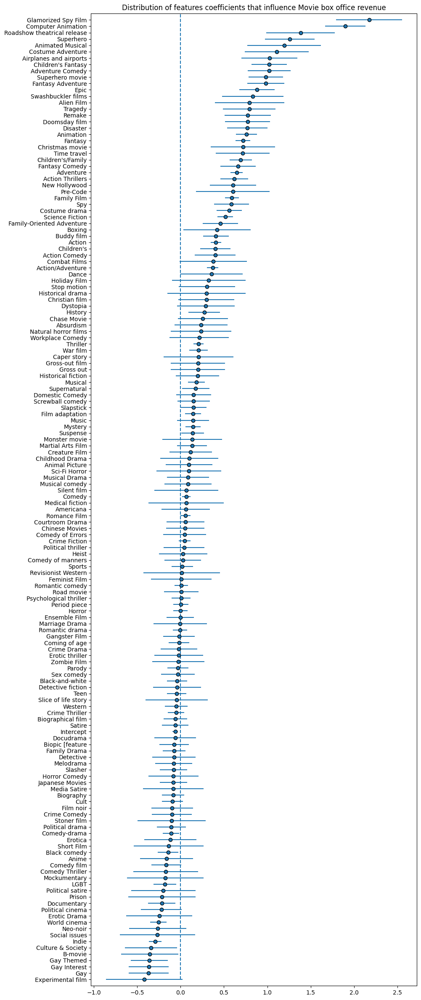

In [40]:
#Extraction of the results of the linear regression 
reg_var = Genre_reg.params.index
reg_coef = Genre_reg.params.values
reg_pvalues = Genre_reg.pvalues
reg_sigma = Genre_reg.bse.values
reg_confidence = Genre_reg.conf_int()

#We store those in a dataframe 
Reg_res = pd.DataFrame(list(zip(reg_var, reg_coef, reg_pvalues,reg_sigma,reg_confidence[0],reg_confidence[1])),
              columns=['reg_var','reg_coef', 'reg_pvalues','reg_sigma','Lower_confidence','Higher_confidence'])

Reg_res = Reg_res.sort_values(by='reg_coef',ascending=True)

#We rearrange a bit the labels to make it more readable 
Reg_res['reg_var'] = Reg_res['reg_var'].str.replace('C(Movie_genres, Treatment("Drama"))[T.', '')
Reg_res['reg_var'] = Reg_res['reg_var'].str.replace(']', '')


#Plotting of the results 
fig = plt.figure(figsize=(10,30))
Reg_res['Err_Lower_confidence'] = Reg_res['Lower_confidence'] - Reg_res['reg_coef']
Reg_res['Err_Higher_confidence'] = Reg_res['Higher_confidence'] - Reg_res['reg_coef']
errors = np.abs(Reg_res[['Err_Lower_confidence','Err_Higher_confidence']].to_numpy()).T

#We are using the 95% confidence interval to compute the error bars
plt.errorbar(Reg_res['reg_coef'],Reg_res['reg_var'],xerr = errors,linestyle = 'none',marker = 'o',markeredgecolor = 'black')


plt.vlines(0,0, len(Reg_res['reg_var']), linestyle = '--')
plt.title('Distribution of features coefficients that influence Movie box office revenue')

plt.ylim((-1,len(Reg_res['reg_var'])))
plt.show()



This graph has too many variables, it's not pleasant to read. However, we can note that doing Glamorized Spy Films, Computer Animation or Roadshow theatrical release movies seem to bring much higher sucess than making a Drama movie. Making Gay, Experimental or Gay Interst movies on the countrary seems to be detrimental for your movie sucess.   

We will start by proposing a new visualisation.  

In [41]:
#We have too much variables to make a readable plot let's choose the most significative to display 
#We keep the 5 most represented genre in the dataset, the 5 genre with the highest coefficient and the 5 with the lowest 
To_display = Reg_res[Reg_res['reg_var'].isin(Important_Genres[0:10])]
#To_display = Reg_res.sort_values(by='reg_coef',ascending = False).head(5)
To_display = pd.concat([Reg_res.sort_values(by='reg_coef',ascending = False).head(10),To_display,Reg_res.sort_values(by='reg_coef',ascending = False).tail(10)]).sort_values(by='reg_coef')

In [42]:
fig = go.Figure()
fig.add_trace(go.Scatterpolar(
    r=[0] * To_display['reg_var'].shape[0],  # Repeat the zero value to close the loop
    theta=To_display['reg_var'],  # Repeat the first category to close the loop
    mode='lines',
    #line_close = True,
    fill='toself',
    name='Zero limit',
    line=dict(color='red'),
))


# Add trace for Line 1
fig.add_trace(go.Scatterpolar(
    r=To_display['Lower_confidence'],  # Repeat the first value to close the loop
    theta=To_display['reg_var'],  # Repeat the first category to close the loop
    
    name='Confidence interval at 95%',
    line=dict(color='orange'),
))

# Add trace for Line 2
fig.add_trace(go.Scatterpolar(
    r=To_display['Higher_confidence'],  # Repeat the first value to close the loop
    theta=To_display['reg_var'],  # Repeat the first category to close the loop
    fill='tonext',
    name='Confidence interval at 95%',
    line=dict(color='orange'),
   # line_close = True 
))

#Add the trace for the mean


To_display = pd.concat([To_display,To_display.head(1)], ignore_index=True)
 
fig.add_trace(go.Scatterpolar(
    r=To_display['reg_coef'],  # Repeat the first value to close the loop
    theta=To_display['reg_var'],  # Repeat the first category to close the loop
    name='Linear Regression coefficient',
    line=dict(color='blue'),
))


fig.update_layout(width=800, height=1000)
#fig.update_polars(bgcolor='#98FB98')
fig.update_layout(title = 'Influence of the movie genre on the sucess of a movie')

SaveOrShowFigure.export_plots(fig, 'Influence_movie_genre')
fig.show()


Here we only kept the 10 genres with the highest linear regression coefficient, the 10 genres with the lowest and the 10 most popular movie genres in the dataset. The orange shaded area indicates the confidence interval. When the line is in the red circle it means that this genre is substantly worse than the refrence 'Drama'.

We have seen the result of the comparison of all different genres to Drama. Let's now automate this process and have look at each couples of genre to see how they compete. To do so we creted below some functions which purpose is to run the linear regression by choosing as a refernce all the genres alternatively. For each genre we compute the linear regression and we keep the highest and the lowest regression coefficients. Then we plot the matrix summurazing all the duels. By doing so, we look if there exists genre that outcompetes all the others or inversly if there are genre which are particuliary bad. 

We use the function Linear_reg_duels which computes the linear regression between all the genres and a reference one. It outputs a matrix with the result of the confrontation of all the movie genres. For each duel we only kept the three movie genres with the highest and the lowest regression coefficients. 

In [43]:
#We compute the matrix of all the genres duels : 
#%%capture
res_pos, res_neg =Robot_Portrait.Linear_reg_duels(Important_Genres,Type_df);

Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Drama"))


Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Comedy"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Romance Film"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Thriller"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Action"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Action/Adventure"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Crime Fiction"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Adventure"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Indie"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Romantic comedy"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Family Film"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Horror"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Romantic drama"))
Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Fantasy"))
Movie_box_office_revenue_sc

In [44]:

fig = px.imshow(res_pos,x=Important_Genres,y=Important_Genres,title = 'Results of duels between different genres : \nBest performing genre')
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.update_layout(width=800, height=500)
fig.show()

Here we observe that the three genres we identified above being better than Drama are also driving more succes than most of the other genres. Glamorized Spy Films, Computer Animation or Roadshow theatrical release genres are beating all of the other genres in that order when comparing the sucess. 

In [45]:
fig = px.imshow(res_neg,x=Important_Genres,y=Important_Genres,title = 'Results of duels between different genres : \nWorse performing genre')
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.update_layout(width=800, height=500)
fig.show()

This tells us something intersting, no matter wihch genre is chosen as reference, the three best and the three worse genres remain stable. 
The three genres which seem to bring the more money are : Glamorized Spy Film, Computer Animation and Roadshow theatrical release. 
The three genres whch are the most detrimental to performances are : Gay, Gay Interest and Experimental Film. 

Now that we have identified the most liked and disliked genre by humans through a linear regression and that we verified that this result is independant of the reference chosen. 

#### Pair Matching 

However, we need to bear in mind that the movie box office revenue could be influenced by a lot of different paremeters, for instance movie language or country of origin. In order to conclude and decide wether the movie genre is responsible or not for a change in a movie performance let's make some pair matching. We will match together movies with the same languages and from the same countries. In order to do that we have arbitrarly chosen a method to quantify the distance between two list of strings and a second function matching() which constructs a graph and matches the sample together in the most optimal way possible. 


In [46]:
#Let's plot the result of the pair matching for two genres 
from EXTERNAL_FUNCTIONS import Robot_Portrait as Robot_Portrait
#Selection of genres 
genre1 = 'Drama'
genre2 = 'Computer Animation'

#Matching and calculation of the mean and the std 
Matched = Robot_Portrait.matching(genre1,genre2,reg_data)
Matched_grp = Matched.groupby('Movie_genres')['Movie_box_office_revenue_scaled'].agg(['mean','std','count'])
Matched_grp['error'] = Matched_grp['std']/Matched_grp['count']**0.5

#Plotting 
fig = px.bar( x=Matched_grp.index, y = Matched_grp['mean'], title='Genres Comparison',error_y=Matched_grp['error'],color =Matched_grp.index )
fig.update_layout(
    xaxis_title='Movie genres',
    yaxis_title='Average succes (Movie_box_office_scaled)'
)
fig.update_layout(width=800, height=500)
fig.show()
SaveOrShowFigure.export_plots(fig, 'Pair_matched')


We will now use a function which does the linear regression on the matched pairs and computes the p-value. A low p-value will mean a hisgh degree of significance of the genre wheras a high p-value tells us that the genre doesn't have any impact and that language or/and movie country could have an impact. 

In [47]:
#We start by comparing our results with the most spread genre : 'Drame'
Robot_Portrait.Significance_of_genre(Type_df,Important_Genres,'Computer Animation','Drama')
Robot_Portrait.Significance_of_genre(Type_df,Important_Genres,'Glamorized Spy Film','Drama')
Robot_Portrait.Significance_of_genre(Type_df,Important_Genres,'Roadshow theatrical release','Drama')
Robot_Portrait.Significance_of_genre(Type_df,Important_Genres,'Gay','Drama')
Robot_Portrait.Significance_of_genre(Type_df,Important_Genres,'Gay Interest','Drama')
Robot_Portrait.Significance_of_genre(Type_df,Important_Genres,'Experimental film','Drama')



Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Computer Animation"))
Drama drives higher sucess than Computer Animation


c:\Users\gsalh\OneDrive - epfl.ch\Cours S1\CS 401 Data analysis\Project_ADA\ada-2023-project-tea4two\EXTERNAL_FUNCTIONS\Robot_Portrait.py:182: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Glamorized Spy Film"))
Drama drives higher sucess than Glamorized Spy Film


c:\Users\gsalh\OneDrive - epfl.ch\Cours S1\CS 401 Data analysis\Project_ADA\ada-2023-project-tea4two\EXTERNAL_FUNCTIONS\Robot_Portrait.py:182: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Roadshow theatrical release"))
The matching doesn't allow us to say if their is a significant differences between Roadshow theatrical release and Drama


c:\Users\gsalh\OneDrive - epfl.ch\Cours S1\CS 401 Data analysis\Project_ADA\ada-2023-project-tea4two\EXTERNAL_FUNCTIONS\Robot_Portrait.py:182: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Gay"))
The matching doesn't allow us to say if their is a significant differences between Gay and Drama


c:\Users\gsalh\OneDrive - epfl.ch\Cours S1\CS 401 Data analysis\Project_ADA\ada-2023-project-tea4two\EXTERNAL_FUNCTIONS\Robot_Portrait.py:182: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Gay Interest"))
The matching doesn't allow us to say if their is a significant differences between Gay Interest and Drama


c:\Users\gsalh\OneDrive - epfl.ch\Cours S1\CS 401 Data analysis\Project_ADA\ada-2023-project-tea4two\EXTERNAL_FUNCTIONS\Robot_Portrait.py:182: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Movie_box_office_revenue_scaled ~ C(Movie_genres, Treatment("Experimental film"))
The matching doesn't allow us to say if their is a significant differences between Experimental film and Drama


c:\Users\gsalh\OneDrive - epfl.ch\Cours S1\CS 401 Data analysis\Project_ADA\ada-2023-project-tea4two\EXTERNAL_FUNCTIONS\Robot_Portrait.py:182: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



0.18370664171905493

## 1.2. Repartition of some occuptions (military, PhD (doctors))

### 1.2.1. Armies

Our aliens are smart. One of them (let's call him Bob) quickly realizes that certain words in the characters' names occur very often, and seem to be militarized according to the role they describe in the scenarios. What is the military organization of Earth?

In [48]:
# MILITARY RANKS
dict_military_ranks = {
    'Marshal': 'Marshal',
    'Admiral': 'Admiral',
    'General': 'General',
    'Brigadier General': 'Brigadier General',
    'Colonel': 'Colonel',
    'Col': 'Colonel',
    'Col.': 'Colonel',
    'Lieutenant Colonel': 'Lieutenant Colonel',
    'Lt. Col': 'Lieutenant Colonel',
    'Major': 'Major',
    'Maj.': 'Major',
    'Captain': 'Captain',
    'Capt.': 'Captain',
    'Commander': 'Commander',
    'Lieutenant Commander': 'Lieutenant Commander',
    'Sheriff': 'Sheriff',
    'Lieutenant': 'Lieutenant',
    'Sergeant': 'Sergeant',
    'Sgt': 'Sergeant',
    'Sgt.': 'Sergeant',
    'Sergeant Major': 'Sergeant Major',
    'Sgt.-Major': 'Sergeant Major',
    'Corporal': 'Corporal',
    'Staff Sergeant': 'Staff Sergeant',
    'Private': 'Private',
    'Major General': 'Major General',
    'Major-General': 'Major General',
    'Major-general': 'Major General'
}

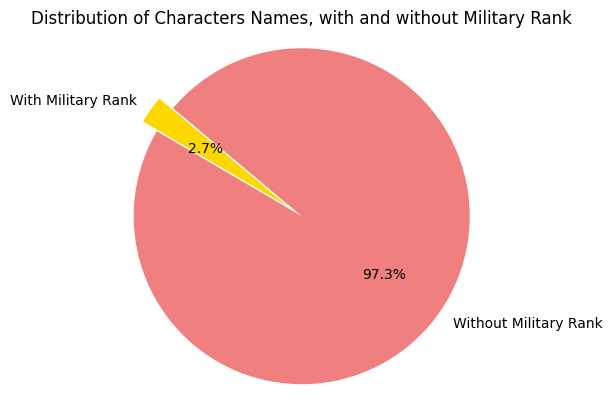

In [49]:
characterDF_copy = copy.deepcopy(characterDF.dropna(subset=['Character Name']))

# Function to check if a military rank is present in the character name
def has_military_rank(name):
    for rank in dict_military_ranks.keys():
        if rank.lower() in name.lower():
            return True
    return False

# Applying the function to the 'Character Name' column
characterDF_copy['Has Military Rank'] = characterDF_copy['Character Name'].apply(has_military_rank)

# Counting the number of characters with and without a military rank
num_characters_with_rank = characterDF_copy['Has Military Rank'].sum()
num_characters_without_rank = len(characterDF_copy) - num_characters_with_rank

# Pie chart
labels = ['With Military Rank', 'Without Military Rank']
sizes = [num_characters_with_rank, num_characters_without_rank]
colors = ['gold', 'lightcoral']
explode = (0.1, 0)  # explode the 'With Military Rank' slice
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=False, startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Characters Names, with and without Military Rank')
plt.show()

In [50]:
28e6/8e9*100

0.35000000000000003

Around three percent of the characters are military personnel. That is a lot, comparatively to [World Bank data on December 2023](https://tradingeconomics.com/world/armed-forces-personnel-total-wb-data.html), for which around 30 million people are military personnel (less than 0.5% of the total world population). 

Our aliens are really interested in understanding the military hierarchy on Earth. One of them suggests that there are fewer leaders than subordinates; therefore, the distribution of ranks should reflect this result... Let's dig into that.

In [51]:
# we sorted the ranks by the decreasing total number of letters, to avoid counting two times the same rank
list_sorted_ranks = sorted(dict_military_ranks.keys(), key=len, reverse=True)

# getting the ranks without repetition
set_mili_ranks = set(dict_military_ranks.values())

# counting the number of each rank
ranks_counter = { rank:0 for rank in set_mili_ranks}
for name in characterDF['Character Name'].dropna(inplace=False):
    for rank in list_sorted_ranks:
        if re.search(fr'\b{rank}\b', name, re.IGNORECASE):
            ranks_counter[ dict_military_ranks[rank] ] +=1
            break #we need to stop to avoid counting two times the same rank (for instance, 'Sgt' and 'Sgt.') 
            
sorted_ranks_freq = dict(sorted(ranks_counter.items(), key=lambda item: item[1], reverse=True))
ranks = list(sorted_ranks_freq.keys())
values = list(sorted_ranks_freq.values())


# Create a DataFrame for the bar chart
bar_chart_df = pd.DataFrame({'Rank': ranks, 'Count': values})
# Horizontal bar chart
fig = px.bar(bar_chart_df, x='Count', y='Rank', orientation='h', color='Rank',
             labels={'Rank': 'Rank', 'Count': 'Count'},
             title='Rank Distribution')
# save the plot as html
fig.show()
SaveOrShowFigure.export_plots(fig, name='rank_distribution')

So the aliens could deduce, for example, that the rank of Private should be higher than that of Captain... There's a cofactor here: the higher you are in the hierarchy, the more important your responsibilities are, and the most intersting you are for the scriptwriters.

### 1.2.2. Doctors

'What about long-studies occupations?' were wondering our alians.

In [52]:
# Extracting doctor lines
df_predoc = characterDF.dropna(subset='Character Name').copy()
df_doctors = df_predoc[df_predoc['Character Name'].str.lower().str.split().apply(lambda x: x[0] if len(x) > 0 else None).isin(['dr.', 'dr'])]

z = 1.96
df_gender = df_doctors.copy()
df_total = df_predoc.copy()

# Mapping gender to binary values
df_gender['is female'] = (df_gender['Actor gender'] == 'F').astype(int)
df_total['is female'] = (df_total['Actor gender'] == 'F').astype(int)

# Sample data
categories = ['Doctors ', 'Total ']
proportions = []
confidence_intervals = []
for df in [df_gender, df_total]:
    group = df['is female']
    proportions.append(group.mean())
    confidence_intervals.append(group.std() / np.sqrt(group.count()))

# Calculate proportions of males
male_proportions = [1 - prop for prop in proportions]

# Create bar chart data
bar_height = 0.35  # Height of the bars
index = np.arange(len(categories))

female_bar = go.Bar(
    y=categories,
    x=proportions,
    orientation='h',
    error_x=dict(type='data', symmetric=True, array=confidence_intervals, visible=True),
    name='Female',
    marker=dict(color='#FF0000'),
)

male_bar = go.Bar(
    y=categories,
    x=male_proportions,
    orientation='h',
    name='Male',
    marker=dict(color='#87CEEB'),
    base=proportions,
)

# Create layout
layout = go.Layout(
    title="Gender Proportions: Entire Data Set vs. Doctors",
    barmode='stack',
    xaxis=dict(title='Proportions (with 95% confidence intervals)'),
    yaxis=dict(title='Categories'),
)

# Create figure with female bars in the foreground
fig = go.Figure(data=[male_bar, female_bar], layout=layout)

fig.show()
SaveOrShowFigure.export_plots(fig, 'gender_proportions_doctors')


The p-value is extremelly low, and lower than 1% in particular, so we can reject the hypothesis of an fair representation of the women in Doctors characters. 

# 2. Can we recreate earth base on the Map of datasets ?

The alien student may wonder himself after studying the portrait robot how the earth looks like. In this part we will try to recreate the map of the earth based on the dataset.

To do so, we will make the common assumption : the alien could think of the countries interactions among themselves and that he knows what is a country^^. This is like observing the star wars galaxy with each planet being a node in the graph.

In our case, the galaxy is "just" the earth and the planets are the countries and hence our nodes. For the Earth representation, countries would represent a point on Earth (like our cities) as if we would considered them to be a surface it would be very difficult to represent and gives a correct definition on how we model the borders between countries.It would have required a 2d definition whereas in our analysis, as we consider the countries as nodes, we can use a 1d definition of the borders: the link between two countries is defined by the number of times they appear together for a movie.

In [53]:
# Create a new dataframe with the number of countries appearances
countriesDF = movieDF['Movie countries'].copy()

countries_uniqueDF = countriesDF.explode().dropna()
countries_uniqueDF = pd.DataFrame(countries_uniqueDF.value_counts().reset_index())
countries_uniqueDF.columns = ['Country', 'Number']

### 2.1 Create adjacency matrix

Following our above explanation on our we will recreate this earth map, we need to defind an adjacency matrix of the countries. This matrix will be a square matrix of size the number of countries in our dataset. The value of the matrix will be the number of times two countries appear together in a movie. In the diagonal, we will put the total number of occurrences of this country in the dataset.

In [54]:
import scipy.sparse as sparse

unique_countries = countries_uniqueDF['Country'].unique()
adjacency_matrix = sparse.lil_matrix((len(unique_countries), len(unique_countries)), dtype=np.int32)

# Iterate over each row in the countries column
for countries in countriesDF:
    countries_list = countries
    
    # Update the adjacency matrix for each pair of countries
    for i in range(len(countries_list)):
        for j in range(i+1, len(countries_list)):
            country1 = countries_list[i]
            country2 = countries_list[j]
            
            # Find the indices of the countries in the unique_countries list
            index1 = np.where(unique_countries == country1)[0][0]
            index2 = np.where(unique_countries == country2)[0][0]
            
            # Increment the corresponding entry in the adjacency matrix
            adjacency_matrix[index1, index2] += 1
            adjacency_matrix[index2, index1] += 1
            
# Add the diagonal entries to adjacency matrix as the weight of self-loops
for i in range(len(unique_countries)):
    adjacency_matrix[i, i] = countries_uniqueDF[countries_uniqueDF["Country"]==unique_countries[i]]["Number"].values[0]

# Convert the adjacency matrix to a dense matrix and apply log to the values
adjacency_matrix_dense = adjacency_matrix.toarray()
adjacency_matrix_log = np.log1p(adjacency_matrix_dense + 1)

# Convert the adjacency matrix to a DataFrame
adjacency_matrix_df = pd.DataFrame(adjacency_matrix_dense, index=unique_countries, columns=unique_countries)

# replace all non-zero values with 1 in a new array
adjacency_matrix_ones = np.where(adjacency_matrix_dense > 0, 1, 0)

### 2.2 Create the graph and define a metric to assess their interaction forces

We will use networkx to create our node graphs for creating our Earth map. Using this library, we will use the common function ```spring_layout``` to create a graph with the nodes and the edges. One option of this function is to define a gravity interaction among the nodes but that is a tuning parameter for the sake of visualization. 

Hence, we add a weight to this graph. To choose this weight and regarding the lecture #12 - Handling network data, we have several choices of how to measure node importance.
Among them, we could think of the degree centrality, the closeness centrality, the betweeness centrality, the Katz centrality or the PageRank centrality.

Our graph is by nature unconnected as we have four unconnected countries (Jordan, Crime, Bahrain, Guinea-Bissau). But the networkx functions understand that and will not take them into account for the centrality measures. That's why on their closeness centrality, we have a value of 0.0 (and not Inf.). 

Our graph is also undirected, so the common metrics we saw in the lecture can't be applied as they are for connected graphs. Degree centrality would be the easisest to model our interaction but we think that it won't reflect very well the reality. Indeed, degree cnetrality only takes into account its neighbours. But in our case, we want to take into account the neighbourhoud of this node. Hence, by lookin on how possibilites, we decided to define our interaction force as the eigenvector centrality. This centrality measure is based on the idea that a node is important if it is connected to other important nodes (actually PageRank and Katz centrality are based on this idea too for directed graph).

In [55]:
G = nx.from_numpy_array(adjacency_matrix_dense)
NetworkPlot.describe_graph(G)

websiteNetworkCountries = pd.DataFrame(columns=["Country", "Degree", "Closeness centrality", "Katz centrality", "PageRank centrality"])
websiteNetworkCountries["Country"] = adjacency_matrix_df.index.tolist()
websiteNetworkCountries["Degree"] = dict(G.degree)
websiteNetworkCountries["Closeness centrality"] = nx.closeness_centrality(G)
websiteNetworkCountries["Katz centrality"] = nx.katz_centrality_numpy(G)
websiteNetworkCountries["PageRank centrality"] = nx.pagerank(G)
websiteNetworkCountries["Eigenvector centrality"] = nx.eigenvector_centrality_numpy(G)

pos = nx.spring_layout(G, k=1.4, seed=1, weight=tuple(websiteNetworkCountries["Eigenvector centrality"]))

G12_countries = ["Australia", "Belgium", "Canada", "France", "Germany", "Italy", "Japan", "Netherlands", "Spain", "Sweden", "Switzerland", "United Kingdom", "United States of America"]
G12_countries_index = []
for country in G12_countries:
    indices = np.where(websiteNetworkCountries["Country"] == country)[0]
    if len(indices) > 0:
        G12_countries_index.append(indices[0])
G12_pos = {i: pos[i] for i in G12_countries_index}
G12_DF = pd.DataFrame({"Country": G12_countries, "Index": G12_countries_index, "Pos": [G12_pos[i] for i in G12_countries_index]})
G12_DF[['Pos x', 'Pos y']] = pd.DataFrame(G12_DF['Pos'].tolist(), index=G12_DF.index)
G12_DF = G12_DF.drop('Pos', axis=1)

edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.08, color='white'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    
d = dict(G.degree)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers+text',
    hoverinfo='text',
    textposition='top center',
    marker=dict(
        showscale=True,
        colorscale='Hot',
        reversescale=False,
        color=[],
        size=[4*np.log(d[i]) for i in G.nodes()],
        colorbar=dict(
            thickness=12,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0.2, color='black')  # Remove the line around each node
    ),
    texttemplate=unique_countries,
    textfont=dict(
        size=[6 for i in range(len(node_x))]
    ),
    hovertext = websiteNetworkCountries[["Country", "Eigenvector centrality", "Degree", "Closeness centrality", "Katz centrality", "PageRank centrality"]].apply(lambda row: "<br>".join([f"{col}: {row[col]}" for col in websiteNetworkCountries[["Country", "Degree", "Eigenvector centrality", "Closeness centrality", "Katz centrality", "PageRank centrality"]].columns]), axis=1)
)

node_adjacencies = []
node_text = []
country_names = adjacency_matrix_df.index.tolist()
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(country_names[node] + ': ' + str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

fig = go.Figure(data=[edge_trace, node_trace],
    layout=go.Layout(
        width=800,
        height=800,
        title='Earth map made by the aliens',
        titlefont_size=16,
        title_x=0.45,  # Set the title position to the center
        title_y=0.99,  # Set the title position to the top
        showlegend=False,
        hovermode='closest',
        margin=dict(b=20, l=5, r=5, t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        paper_bgcolor= "rgba(197, 227, 231, 0.8)",
        plot_bgcolor= "rgba(197, 227, 231, 0)",
    )
)


center_x = 0
center_y = 0
radius_4 = 1.1
fig.add_shape(
    type="circle",
    x0=center_x - radius_4,
    y0=center_y - radius_4,
    x1=center_x + radius_4,
    y1=center_y + radius_4,
    line=dict(color="black", width=0.5),
    fillcolor='rgba(255, 255, 0, 0.1)',
    layer='below',
)

# add a circle that encircles all node positions in G12_DF
center_x = np.mean(G12_DF["Pos x"])
center_y = np.mean(G12_DF["Pos y"])
radius = max(np.sqrt((G12_DF["Pos x"] - center_x)**2 + (G12_DF["Pos y"] - center_y)**2))

fig.add_shape(
    type="circle",
    x0=center_x - radius,
    y0=center_y - radius,
    x1=center_x + radius,
    y1=center_y + radius,
    line=dict(color="black", width=1),
    fillcolor='rgba(100, 255, 100, 0.1)',
    layer='below',
)

fig.show()
SaveOrShowFigure.export_plots(fig, "Earth map made by the aliens")

Graph with 147 nodes and 1614 edges
Graph is not connected
Diameter and Avg shortest path length are not defined!
Sparsity: 0.1504
Global clustering coefficient aka Transitivity: 0.4215


This really impressive earth map convey to the aliens the idea that the earth is a very connected planet. Indeed, we can see that the countries are very close to each other and that some of them are really linked. 

We added two circles :
- the outer circle is simply for the visualization of the graph.
- the second inner circle is added by us by plotting the smallest circle that contains all G12 countries. This shows well that G12 countries are well-linked among themselves and that they are the most important countries in the world. Actually in the G12 circles, we have three more countries (Soviet Union/Russia, Argentina, India) that are (since August 2023 for Argentina) countries among the BRICS.

However this graph has indeed some limits. One of them is that we plot all "countries" as the aliens have not way of checking if this country really still exist. They can see in which year this country appeared in the dataset but they can't know if this country still exist. For example, the Soviet Union is still in the graph but it doesn't exist anymore.

# 3. Influence of movies on society, and vice-versa based on firstnames repartition

Through the study of the firstnames apperances in movies characters and by comparing them with a dataset of the firstnames of the US population, we will try to understand if the movies have an influence on the choice of the firstnames.
The dataset we will use to compare the firstnames is...

### 3. 1. Adding real babies names dataset and comparing temporal frequencies between reality and fiction

For our study, we will restrain ourself to a dataset of movies that was released in the USA as our comparison dataset is the birth register of the USA for each year between 1880 and 2022.

In [56]:
# Define function to format revenue values with K or B suffix
def format_revenue(revenue):
    if revenue >= 1e9:
        return '${:.1f}B'.format(revenue / 1e9)
    elif revenue >= 1e6:
        return '${:.1f}M'.format(revenue / 1e6)
    else:
        return '${:,.0f}'.format(revenue)

# Calculate proportion of NaN values in Movie box office revenue column
nan_proportion = movieDF["Movie box office revenue"].isna().sum() / len(movieDF)

# keep in movieDF only the movies with in Movie countries the id /m/09c7w0
USAmovieDF = movieDF[movieDF["Freebase country"].astype(str).str.contains("/m/09c7w0")]

# Create bar chart
fig = go.Figure(go.Bar(
    x=USAmovieDF.dropna(subset=["Movie box office revenue"]).sort_values(by="Movie box office revenue",ascending=True).tail(50)["Movie box office revenue"], 
    y=USAmovieDF.dropna(subset=["Movie box office revenue"]).sort_values(by="Movie box office revenue",ascending=True).tail(50)["Movie name"], 
    orientation='h',
    text=[format_revenue(revenue) for revenue in USAmovieDF.dropna(subset=["Movie box office revenue"]).sort_values(by="Movie box office revenue",ascending=True).tail(50)["Movie box office revenue"]],
    textposition='outside',
    marker=dict(
        color=[i for i in range(50)],
        colorscale='cividis'
    ),
    hovertext=[f"<b>Movie:</b> {name}<br><b>Box Office Revenue:</b> {format_revenue(revenue)}" for name, revenue in zip(USAmovieDF.dropna(subset=["Movie box office revenue"]).sort_values(by="Movie box office revenue", ascending=True).tail(50)["Movie name"], USAmovieDF.dropna(subset=["Movie box office revenue"]).sort_values(by="Movie box office revenue", ascending=True).tail(50)["Movie box office revenue"])]
))

# Update layout
fig.update_layout(
    height=1000,
    xaxis_title="Box office revenue",
    yaxis_title="Movie name",
    title={
        'text': 'Top 50 Movies by Box Office Revenue<br><span style="font-size: 12px;">{:.1%} of Movie Box Office Revenue values are NaN</span>'.format(nan_proportion),
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis=dict(
        showgrid=True,  # Show vertical grid lines
        gridcolor='rgba(211, 211, 211, 0.6)',  # Set grid line color
    ),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    font=dict(
        size=12
    ),
    margin=dict(
        l=200
    )
)

fig.show()
SaveOrShowFigure.export_plots(fig, 'barplot_top_50_movies_by_box_office_revenue')

An other alternative is to draw a WordCloud with the top 50 movies by box office revenue

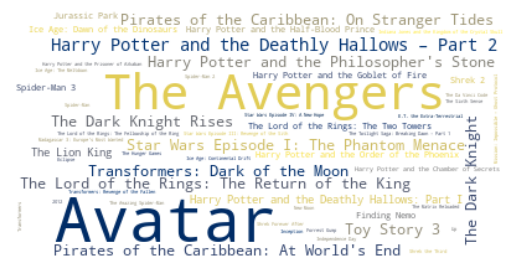

In [57]:
# Drop rows with missing values in the "Movie box office revenue" column
movieDF_cleaned = USAmovieDF.dropna(subset=["Movie box office revenue"])

# Create a dictionary with movie names as keys and their box office revenue as values
movie_name_revenue_dict = dict(zip(movieDF_cleaned["Movie name"], movieDF_cleaned["Movie box office revenue"]))

# Generate the word cloud from the movie names and their box office revenue
wordcloud = WordCloud(
    max_font_size=50,
    background_color="white",
    colormap="cividis",
).generate_from_frequencies(movie_name_revenue_dict)

# Display the word cloud
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

#### 3.2 Two first simple analysis of the firstnames dataset

As the Firstnames_fromBabyDF apperance for characters on the silver screen is a categorical variable each year, the alien student won't be able to see if the most voted name that he will find in the dataset reflects the reality. So we will use an other dataset that recense the firstnames of babies born in the USA over the years. 

For our first study, we will restrain ourself to the top 100 movies by box office revenue. We will then compare the firstnames of the characters in the movies with the firstnames of the babies born in the USA.

Our first goal, before trying to dig into the influence of movies characters firstnames and babies firstnames, is to see if some firstnames was created by the movies. To do so, we will compare the firstnames of the characters in the movies with the firstnames of the babies born in the USA based on their year appearance in the movies.

Import the babyname dataset in the US

In [58]:
# we will extract only the characters from the top 100 movies in the dataset based movieDF["Movie box office revenue"]
top100_characters = characterDF[characterDF["Wikipedia movie ID"].isin(movieDF.sort_values(by="Movie box office revenue",ascending=False)["Wikipedia movie ID"].head(100))]

PATH_IN = '.\\DATA\\AddedDatasets\\Name'

baby_nameDF = DataImport.OpenBabyNameDf(PATH_IN)

Extract valid firstnames from character firstname

By a simple match, we are able to recognize firstnames that exist in the babyname dataset. We use the external function 'extract_top_firstname' (please see ```DatasetTreatment.py```), that we developed, which returns the fistnames that exist for a character firstname

In [59]:
%%capture
# Create a set of valid first names from baby_nameDF["Firstname"]
valid_firstnames = set(baby_nameDF["Firstname"])
name_occurrences = baby_nameDF[baby_nameDF["Firstname"].isin(valid_firstnames)].groupby("Firstname")["Number"].sum().reset_index()
name_occurrences_dict = dict(zip(name_occurrences["Firstname"], name_occurrences["Number"]))

# Apply the function to the "Character Name" column
top100_characters["Character firstname"] = top100_characters["Character Name"].apply(lambda x: DatasetTreatment.extract_top_firstname(x,valid_firstnames,name_occurrences_dict))
top100_characters.dropna(subset=["Character firstname"], inplace=True)

name_occurrences["First year appearance"] = baby_nameDF[baby_nameDF["Firstname"].isin(valid_firstnames)].groupby("Firstname")["Year"].min().reset_index()["Year"]
top100_characters["Year"] = pd.to_datetime(top100_characters["Movie release date"]).dt.year

##### 3.2.1 Study on the babies firstname recensed in the US after their presence in a movie

To do so, we will merge the movie dataset with the character dataset so that we will be able to link from which movie a character is from. 

In [60]:
# Merge the DataFrames on the "Firstname" column
merged_data = top100_characters.merge(name_occurrences, left_on="Character firstname", right_on="Firstname", how="left")

# Convert the "First year appearance" and "Year" columns to integers
merged_data["First year appearance"] = merged_data["First year appearance"].astype(int)
merged_data["Year"] = merged_data["Year"].astype(int)

# Filter the rows where "First year appearance" is greater than "Year" + 10
filtered_data = merged_data[merged_data["First year appearance"] > merged_data["Year"]]
filtered_data = filtered_data.merge(movieDF[["Freebase movie ID","Movie name"]], left_on="Freebase movie ID", right_on="Freebase movie ID", how="left")

# Calculate the number of names and their films
num_names_with_films = len(filtered_data)

# Print the result
print("Number of names with their films where the name wasn't present before the film in name_occurrences:", num_names_with_films)

Number of names with their films where the name wasn't present before the film in name_occurrences: 84


In [61]:
# Calculate the number of names and their films
num_names_with_films = len(filtered_data)

# Log-transform the frequencies
filtered_data["LogFrequency"] = np.log1p(filtered_data["Number"].copy())

# Generate the word cloud with a specific colormap (e.g., 'viridis')
wordcloud = WordCloud(
    max_font_size=50,
    max_words=100,
).generate_from_frequencies(dict(zip(filtered_data["Character firstname"], filtered_data["LogFrequency"])))

# Convert the word cloud data to a DataFrame
wordcloud_df = pd.DataFrame({"label": wordcloud.words_.keys(), "log_frequency": wordcloud.words_.values()})
wordcloud_df["Character Name"] = wordcloud_df["label"].map(filtered_data.groupby("Character firstname")["Character Name"].max())
wordcloud_df["First year appearance"] = wordcloud_df["label"].map(filtered_data.groupby("Character firstname")["First year appearance"].min())
wordcloud_df["Movie year"] = wordcloud_df["label"].map(filtered_data.groupby("Character firstname")["Year"].unique())
wordcloud_df["Movie name"] = wordcloud_df["label"].map(filtered_data.groupby("Character firstname")["Movie name"].unique())

# Create a treemap using Plotly Express with a different color scale
fig = go.Figure(go.Treemap(
    labels=wordcloud_df["label"],
    parents=[""] * (len(wordcloud_df["label"])+1),
    values=wordcloud_df["log_frequency"],
    root_color="white",
    marker_colorscale='Blues',
    hovertext=["<b>Character Name:</b> {}<br><b>First year appearance:</b> {}<br><b>Movie(s):</b><br>{}".format(name, first_year, "<br>".join("{}: {}".format(y, n) for y, n in sorted(zip(movie_year, movie_name)))) for name, first_year, movie_year, movie_name in zip(wordcloud_df["Character Name"], wordcloud_df["First year appearance"], wordcloud_df["Movie year"], wordcloud_df["Movie name"])],
))

# Update layout with log scale for size and add a title
fig.update_layout(
    height=500,
    margin=dict(l=20, r=20, b=20, t=80),
    title=dict(
        text="Character firstname that appeared first in a movie than in the US birth register",
        font=dict(size=20),  # Increase title font size
    ),
)

fig.show()
SaveOrShowFigure.export_plots(fig, 'treemap_top_100_characters')

As evident from the word cloud map, certain names, such as 'Kenobi' from Star Wars or 'Ollivander' from Harry Potter, bear a high likelihood of being influenced by movies. For sure, these firstnames weren't present before in the birth register and some of them (those from famous saga like Star Wars, Harry Potter, The Lord of Rings) have between less than 3 years of difference between both apperances in movies and then in a birth register. This observation underscores the intriguing phenomenon that some names are crafted by cinematic works. it could be particularly prevalent in fantasy genres where the creative invention of names is more common and we will try to highlight the genre provenance of these names. 

In [62]:
probable_newFirstnameDF = filtered_data.drop_duplicates()
probable_newFirstnameDF = movieDF[movieDF["Movie name"].isin(probable_newFirstnameDF["Movie name"])].sort_values(by="Movie box office revenue",ascending=False)

print("Number of names with their films where the name wasn't present before the film in name_occurrences:", len(probable_newFirstnameDF["Movie name"].unique()))

genres = probable_newFirstnameDF["Movie genres"].explode().reset_index(drop=True)

genre_counts = genres.value_counts()
genre_counts["Other negligible genres"] = genre_counts[genre_counts < 5].sum()
genre_counts = genre_counts[genre_counts > 5]

fig = px.pie(genre_counts, values=genre_counts.values, names=genre_counts.index, title='Repartition of the genres of the movie with new firstnames')
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(
    height=500,
    margin=dict(l=20, r=20, b=20, t=80),
    title=dict(
        font=dict(size=20),
    ),
    plot_bgcolor='rgba(0,0,0,0)',
)

fig.show()
SaveOrShowFigure.export_plots(fig, 'piechart_repartition_of_the_genres_in_the_top_400_movies')

# what is the mean of the box office revenue of the movies with new firstnames
print("Mean of the box office revenue of the movies with new firstnames:", probable_newFirstnameDF["Movie box office revenue"].median())

# Find the ranking of this mean
print("Ranking of the mean of the box office revenue of the movies with new firstnames:", probable_newFirstnameDF["Movie box office revenue"].rank(ascending=False).median())

Number of names with their films where the name wasn't present before the film in name_occurrences: 42


Mean of the box office revenue of the movies with new firstnames: 792910554.0
Ranking of the mean of the box office revenue of the movies with new firstnames: 22.0


This plot confirms our intuition that the apparition of a name in a movie is more likely to be in a film with a high box office revenue and that the main genres are Adventure, Action, Fantasy. However, we must be careful with this result as one movie is often associated with multiple genres. For example, Harry Potter is categorized in at least the top 4 genres in the above plot. Hence, our interpretation is more that the top genres are more likely to create new firstnames due to the essence of the genre (e.g. fantasy).

As a last interesting point is that the mean box office revenue of this top 100 movies. Indeed, the mean box office revenue would be positioned at the 22th place in the top 100 movies by box office revenue.

#### 3.3 Study on general trends of movies firstnames over the year

We're also interested in checking out how names have changed over time. It's not just about the new names or ones from movies. We want to see if the names people use in real life match up with the names in movies. This way, we can get an idea of the most likely names for our characters based on the time they're set in and hence help our fellow aliend friends to understand the correct firstnames distribution in the human population over the years.

In [63]:
characterDF["Year"] = pd.to_datetime(characterDF["Movie release date"]).dt.year

# Apply the function to the "Character Name" column
characterDF["Character firstname"] = characterDF["Character Name"].apply(lambda x: DatasetTreatment.extract_top_firstname(x,valid_firstnames,name_occurrences_dict))
Firstname_characterDF = characterDF
Firstname_characterDF.dropna(subset=["Character firstname"], inplace=True)

# Create a new DataFrame with the number of occurrences of each firstname groupping by the counting given in baby_nameDF of this firstname for each year
name_occurrences_by_year = baby_nameDF.groupby(["Firstname", "Year", "Sexe"])["Number"].sum().reset_index()
name_occurrences_by_year = name_occurrences_by_year[name_occurrences_by_year["Firstname"].isin(characterDF["Character firstname"].unique())]
name_occurrences_by_year["Year"] = pd.to_datetime(name_occurrences_by_year["Year"], format='%Y')

From the actor genre of each character, it is possible to reduce the mixed names to a single genre. This will help us to have a better understanding of the trends in firstnames. The US baby firstnames datasets is polluted by mixed names that are, in reality, "well-defined".

In [64]:
# Sort out the most common gender for all unique firstnames
commonGenderDF = characterDF[['Character firstname', 'Actor gender']].dropna(subset=['Actor gender']).copy()
commonGenderDF['Binary genre'] = commonGenderDF['Actor gender'].map({'M': 0, 'F': 1})
commonGenderDF = commonGenderDF.groupby('Character firstname')['Binary genre'].mean().reset_index()
commonGenderDF['Common gender'] = commonGenderDF['Binary genre'].apply(lambda x: 'F' if x > 0.5 else 'M')

#### 3.4 Trying to see if the tendency is that movies are in advance or copy what existed previously.

To lighten the study, we will only focus on the top 400 firstnames in the US. The goal of this study is to have a better understanding of the firstnames in movies compared to what we have in reality. At the end, we are more focusing on if they both follow the same trends with a certain delay or not. This probable correlation will help us to name our human.

In [65]:
from fuzzywuzzy import fuzz
USAmovieDF = movieDF.copy()
USAmovieDF["Score"] = movieDF["Movie countries"].apply(lambda x: fuzz.partial_ratio(x, "United States"))
USAmovieDF = USAmovieDF[USAmovieDF["Score"] > 80]
USAmovieDF = USAmovieDF.loc[:, ["Movie countries", "Freebase movie ID"]]
USAFirstname_characterDF = Firstname_characterDF.merge(USAmovieDF, on="Freebase movie ID", how="inner")
USAFirstname_characterDF = USAFirstname_characterDF.merge(movieDF[movieDF["Movie box office revenue"].notna()], on="Freebase movie ID", how="inner")

firstname_occurrences_by_year = USAFirstname_characterDF.groupby(["Freebase movie ID", "Year", "Character firstname", "Actor gender"]).size().reset_index(name="Number of Occurrences")

baby_nameDF = baby_nameDF.merge(commonGenderDF, how="right", left_on=["Firstname", "Sexe"], right_on=["Character firstname", "Common gender"])
baby_nameDF["Year"] = pd.to_datetime(baby_nameDF["Year"], format='%Y').dt.year
firstname_occurrences_by_year["Year"] = pd.to_datetime(firstname_occurrences_by_year["Year"], format='%Y').dt.year

In [66]:
# Print the top 10 most occurent firstnames in the US
Total_occurences = baby_nameDF.groupby("Firstname")["Number"].sum().reset_index()
Total_occurences = Total_occurences[Total_occurences["Firstname"].isin(characterDF["Character firstname"].unique())]
Total_occurences = Total_occurences.sort_values(by="Number", ascending=False)

print("Top 10 most occurent firstnames in the US:")
Total_occurences.head(10)

Top 10 most occurent firstnames in the US:


,Firstname,Number
4882,James,5214844.0
5163,John,5158428.0
8905,Robert,4838129.0
7160,Michael,4401604.0
11275,William,4167487.0
6894,Mary,4134713.0
2508,David,3654723.0
5219,Joseph,2647283.0
8818,Richard,2572740.0
1885,Charles,2417569.0


This above results are relevant for our alien students that want to build a portrait robot. Now, he has a robot portrait completed by gathering these information with the above results in the previous part.

Selection choice of 10 names: James, Julie, Jackson, Hannah, Alice, George, Carol, Frank

In [67]:
# Keep years from baby names that are in the interval of each firstname in movies appearance
min_year_by_firstname = firstname_occurrences_by_year.groupby("Character firstname")["Year"].min()
max_year_by_firstname = firstname_occurrences_by_year.groupby("Character firstname")["Year"].max()
firstnames_to_keep = min_year_by_firstname.index
baby_nameDF_reduced = baby_nameDF[baby_nameDF["Firstname"].isin(firstnames_to_keep)]
filtered_baby_nameDF = baby_nameDF_reduced.groupby("Firstname").apply(lambda x: x[(x["Year"] >= min_year_by_firstname.loc[x.name]) & (x["Year"] <= max_year_by_firstname.loc[x.name])]).reset_index(drop=True)

Firstnames_fromBabyDF = filtered_baby_nameDF.merge(firstname_occurrences_by_year, left_on=["Firstname", "Year"], right_on=["Character firstname", "Year"], how="left")
Firstnames_fromBabyDF = Firstnames_fromBabyDF.drop(columns=["Character firstname_x", "Character firstname_y"])
Firstnames_fromBabyDF = Firstnames_fromBabyDF.rename(columns={"Number":"Number of birth","Count":"Number of occurrences in movies", "Sexe": "Gender"})

In [68]:
# Create a new DataFrame with the number of occurrences of each firstname groupping by the counting given in baby_nameDF of this firstname for each year
births_by_year = baby_nameDF.groupby("Year")["Number"].sum().reset_index()
firstnames_by_year = baby_nameDF.groupby("Year")["Firstname"].count().reset_index()

# Creation of websisteFirstnameTrend based on Firstnames_fromBabyDF
websiteFirstnameTrend = Firstnames_fromBabyDF.sort_values(by="Year").copy(deep=True)
websiteFirstnameTrend["Frequency of Birth"] = websiteFirstnameTrend.apply(lambda row: row["Number of birth"] / births_by_year[births_by_year["Year"] == row["Year"]]["Number"].values[0], axis=1)
websiteBabyDF = websiteFirstnameTrend.copy(deep=True)
websiteFirstnameTrend = websiteFirstnameTrend[websiteFirstnameTrend["Freebase movie ID"].notna()]

# Added columns to websiteFirstnameTrend for the normalized frequency of birth and the normalized frequency in movies
websiteFirstnameTrend['Number of Occurrences'] = websiteFirstnameTrend.groupby(['Year', 'Firstname']).transform('size')
websiteFirstnameTrend.rename(columns={"Number of Occurrences":"Number of occurrences in movies"}, inplace=True)
websiteFirstnameTrend["Frequency in Movies"] = websiteFirstnameTrend.apply(lambda row: row["Number of occurrences in movies"] / firstnames_by_year[firstnames_by_year["Year"] == row["Year"]]["Firstname"].values[0], axis=1)
websiteBabyDF["Normalized frequency of birth"] = websiteBabyDF.groupby("Firstname")["Frequency of Birth"].transform(lambda x: x / x.max())
websiteFirstnameTrend["Normalized frequency in movies"] = websiteFirstnameTrend.groupby("Firstname")["Frequency in Movies"].transform(lambda x: x / x.max())
websiteFirstnameTrend = websiteFirstnameTrend.merge(commonGenderDF, left_on="Firstname", right_on="Character firstname", how="inner")

We want for the ten arbitrary chosen firstnames to display two curves:
- The first one is the evolution of the number of babies born with this firstname over the years
- The second one is the evolution of the number of characters with this firstname over the years

As a visual guide, this will help us to see if the firstnames in movies are in advance or copy what existed previously.
Then, in a second time, we will process all of the firstnames in the dataset to see if a trend/time delay appears in some firstname and what could be the correlation between the two curves on all firstnames

To do so, we use the savgol filter that will help us to smooth the curves and to see the trends more easily. We have multiples occurrences of a firstname each year in the dataset. We will then group them by year and count the number of occurences. We will then apply the savgol filter on the resulting dataframe.

In [69]:
# Savgol filter
window_length = 10
polyorder = 2
websiteFirstnameTrend["Smooth normalized frequency in movies"] = None
for firstname in websiteFirstnameTrend["Firstname"].unique():
    data = websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname].sort_values(by="Year")["Normalized frequency in movies"]
    if len(data) < window_length:
        continue
    smoothed_values = savgol_filter(data, window_length=window_length, polyorder=polyorder)
    websiteFirstnameTrend.loc[websiteFirstnameTrend["Firstname"] == firstname, "Smooth normalized frequency in movies"] = smoothed_values

websiteFirstnameTrend["Mean smooth normalized frequency in movies"] = websiteFirstnameTrend.groupby(["Firstname", "Year"])["Smooth normalized frequency in movies"].transform("mean")
websiteFirstnameTrend["Smooth normalized frequency in movies"] = websiteFirstnameTrend.groupby(["Firstname"])["Smooth normalized frequency in movies"].transform(lambda x: x / x.max())

websiteFirstnameTrend = websiteFirstnameTrend[websiteFirstnameTrend["Normalized frequency in movies"].notna()]
websiteFirstnameTrend = websiteFirstnameTrend[websiteFirstnameTrend["Smooth normalized frequency in movies"].notna()]  

websiteFirstnameTrend["Smooth normalized mean frequency in movies"] = None
for firstname in websiteFirstnameTrend["Firstname"].unique():
    data = websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname].sort_values(by="Year")["Mean smooth normalized frequency in movies"]
    if len(data) < window_length:
        continue
    smoothed_values = savgol_filter(data, window_length=window_length, polyorder=polyorder)
    websiteFirstnameTrend.loc[websiteFirstnameTrend["Firstname"] == firstname, "Smooth normalized mean frequency in movies"] = smoothed_values

We also add a weight based on the Movie box office revenue scaled. The idea is that the more a movie is successful, the more the name is likely to have an influence on the population. We will then multiply the number of occurences by the weight.

We also perform a normalization of both frequencies to have a better understanding of the trends.

In [70]:
# Weight of the score of the movie box office revenue
WeightDF = USAFirstname_characterDF.groupby(["Character firstname"])["Movie box office revenue"].sum().reset_index()
WeightDF = WeightDF[WeightDF["Character firstname"].isin(websiteFirstnameTrend["Firstname"].unique())]
WeightDF["Weight"] = WeightDF["Movie box office revenue"] / WeightDF["Movie box office revenue"].max()

In [71]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

color1 = colors_hex[9]
color2 = colors_hex[4]
color3 = 'rgba(255, 160, 0, 0.4)'

# Taylor
Initialfirstname = "Taylor"
fig.add_trace(go.Scatter(
    x=websiteBabyDF[websiteBabyDF["Firstname"] == Initialfirstname].sort_values(by="Year")["Year"],
    y=websiteBabyDF[websiteBabyDF["Firstname"] == Initialfirstname].sort_values(by="Year")["Normalized frequency of birth"],
    mode='lines',
    name="Normalized frequency of birth",
    line=dict(color=color1),
    legendgroup='Normalized frequency of birth',
    showlegend=True,
    visible=True
))
fig.add_trace(go.Scatter(
    x=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == Initialfirstname].groupby(["Firstname", "Year"])["Smooth normalized mean frequency in movies"].mean().reset_index()["Year"],
    y=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == Initialfirstname].groupby(["Firstname", "Year"])["Smooth normalized mean frequency in movies"].mean().reset_index()["Smooth normalized mean frequency in movies"],
    mode='lines',
    name="Normalized mean frequency in movies",
    line=dict(color=color2),
    legendgroup='Normalized mean frequency in movies',
    showlegend=True,
    visible=True
))
fig.add_trace(go.Scatter(
    x=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == Initialfirstname].sort_values(by="Year")["Year"],
    y=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == Initialfirstname].sort_values(by="Year")["Smooth normalized frequency in movies"],
    mode='markers',
    name="Normalized individual frequency in movies",
    marker=dict(symbol='circle-open', color=color3),
    legendgroup='Normalized individual frequency in movies',
    showlegend=True,
    visible=True
))


firstnames = ["Eva", "Henry", "Jackson", "Jason", "Luke", "Mary"]

for firstname in firstnames:
    fig.add_trace(go.Scatter(
        x=websiteBabyDF[websiteBabyDF["Firstname"] == firstname].sort_values(by="Year")["Year"],
        y=websiteBabyDF[websiteBabyDF["Firstname"] == firstname].sort_values(by="Year")["Normalized frequency of birth"],
        mode='lines',
        name="Normalized frequency of birth",
        line=dict(color=color1),
        legendgroup='Normalized frequency of birth',
        showlegend=True,
        visible=False
    ))
    fig.add_trace(go.Scatter(
        x=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname].groupby(["Firstname", "Year"])["Smooth normalized mean frequency in movies"].mean().reset_index()["Year"],
        y=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname].groupby(["Firstname", "Year"])["Smooth normalized mean frequency in movies"].mean().reset_index()["Smooth normalized mean frequency in movies"],
        mode='lines',
        name="Smooth normalized frequency in movies",
        line=dict(color=color2),
        legendgroup='Normalized mean frequency in movies',
        showlegend=True,
        visible=False
    ))
    fig.add_trace(go.Scatter(
        x=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname].sort_values(by="Year")["Year"],
        y=websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname].sort_values(by="Year")["Smooth normalized frequency in movies"],
        mode='markers',
        name="Smooth normalized frequency in movies",
        marker=dict(symbol='circle-open', color=color3),
        legendgroup='Normalized individual frequency in movies',
        showlegend=True,
        visible=False
    ))


fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(
                    label=Initialfirstname,
                    method="update",
                    args=[{"visible": [True, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]}]
                ),
                dict(
                    label=firstnames[0],
                    method="update",
                    args=[{"visible": [False, False, False, True, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]}]
                ),
                dict(
                    label=firstnames[1],
                    method="update",
                    args=[{"visible": [False, False, False, False, False, False, True, True, True, False, False, False, False, False, False, False, False, False, False, False, False]}]
                ),
                dict(
                    label=firstnames[2],
                    method="update",
                    args=[{"visible": [False, False, False, False, False, False, False, False, False, True, True, True, False, False, False, False, False, False, False, False, False]}]
                ),
                dict(
                    label=firstnames[3],
                    method="update",
                    args=[{"visible": [False, False, False, False, False, False, False, False, False, False, False, False, True, True, True, False, False, False, False, False, False]}]
                ),
                dict(
                    label=firstnames[4],
                    method="update",
                    args=[{"visible": [False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, True, False, False, False]}]
                ),
                dict(
                    label=firstnames[5],
                    method="update",
                    args=[{"visible": [False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, True]}]
                ),
            ]),
            direction="up",
            showactive=True,
            x=0.95,
            xanchor="left",
            y=0.05,
            yanchor="auto"
        ),
    ]
)

fig.update_xaxes(showticklabels=True, title_text='Year')  # Show x-axis tick labels and set x-axis title
fig.update_yaxes(showticklabels=True, title_text='Normalized frequency', secondary_y=False)  # Show y-axis tick labels and set y-axis title

fig.update_layout(
    title_text='Normalized frequency of some arbitrary chosen firstnames in movies and in birth register',
    legend=dict(
        orientation="h",
        yanchor="auto",
        y=-0.3,
        xanchor="auto",
        x=0.5
    ),
    title_x=0.5  # Center the title
)

fig.show()
SaveOrShowFigure.export_plots(fig, 'linechart_normalized_frequency_of_some_arbitrary_chosen_firstnames_in_movies_and_in_birth_2')

Based on this above graph, we are able now to perform a correlation between the two curves for all firstnames that we kept in our dataset. We will then be able to see if there is a correlation between the two curves and if there is a time delay between the two curves.

To do so, we choose to do a cross-correlation between the two curves. The cross-correlation is a measure of similarity of two series as a function of the displacement of one relative to the other. As we want to find an offset and not just a correlation, we won't use a regression. This could have been a great analysis if we wanted to see if the firstnames curves aligned. 

However, we want to see if there is a time delay between the two curves. The cross-correlation will gives as output a curves of the correlation between the two curves for each time delay. The time delay that maximizes the correlation is the one that we are looking for.

In [72]:
# Cross-correlation analysis
cross_correlation_results = pd.DataFrame(columns=["FirstName", "Cross-Correlation", "Time Delay"])

for firstname in websiteFirstnameTrend["Firstname"].unique():
    x = websiteBabyDF[websiteBabyDF["Firstname"] == firstname]["Normalized frequency of birth"]
    y = websiteFirstnameTrend[websiteFirstnameTrend["Firstname"] == firstname]["Smooth normalized frequency in movies"]*WeightDF[WeightDF["Character firstname"] == firstname]["Weight"].values[0]
    cross_correlation = correlate(x, y, mode="full")
           
    time_delay = np.argmax(cross_correlation) - len(x) + 1
   
    result_df = pd.DataFrame({"FirstName": [firstname], "Cross-Correlation": [cross_correlation], "Time Delay": [float(time_delay)]})
    cross_correlation_results = pd.concat([cross_correlation_results, result_df], ignore_index=True)

C:\Users\gsalh\AppData\Local\Temp\ipykernel_35580\2024854917.py:12: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [73]:
TOP = 200
top_firstname = websiteFirstnameTrend.groupby("Firstname")["Number of birth"].sum().sort_values(ascending=False).head(TOP).index
df_not_reduced = cross_correlation_results.copy()
df = cross_correlation_results[cross_correlation_results["FirstName"].isin(top_firstname.values)]

dflist = df.groupby('Time Delay')['FirstName'].apply(lambda x: sorted(x)).reset_index()
dflist_not_reduced = df_not_reduced.groupby('Time Delay')['FirstName'].apply(lambda x: sorted(x)).reset_index()

dflist.columns = ['Time Delay', 'FirstNameList']
dflist_not_reduced.columns = ['Time Delay', 'FirstNameList']

dflist_0 = dflist[dflist["Time Delay"] == 0]
dflist_0_not_reduced = dflist_not_reduced[dflist_not_reduced["Time Delay"] == 0]

dflist = dflist[dflist["Time Delay"] != 0]
dflist_not_reduced = dflist_not_reduced[dflist_not_reduced["Time Delay"] != 0]

dflist['colors'] = dflist['Time Delay'].astype(float)
dflist_not_reduced['colors'] = dflist_not_reduced['Time Delay'].astype(float)

dflist['FirstNameList'] = dflist['FirstNameList'].apply(lambda names: ', '.join(names))
dflist['Full list name'] = dflist_not_reduced['FirstNameList'].apply(lambda names: ', '.join(names))
dflist = dflist.sort_values(by="Time Delay", ascending=True).reset_index(drop=True)

fig = px.bar(
    dflist,
    x='Time Delay',
    y=dflist.index,
    color='colors', 
    text='FirstNameList',
    orientation='h',
    width=900,
    height=1000,
    color_continuous_scale='RdYlGn',
    color_continuous_midpoint= 4.14,
)
fig.update_traces(
    textfont_size=12, 
    textangle=0, 
    textposition="outside",
    cliponaxis=True,
)
fig.update_xaxes(side="top")

fig.update_layout(
    height=1500,
    width=800,
    yaxis_title='',
    xaxis_title='Time delay (year)',
    title='Comparison of time delay for firstnames between birth and movies',
    xaxis=dict(
        title_font=dict(size=8),
        tickfont=dict(size=8),
    ),
    font=dict(size=12),
    title_x=0.5,
    yaxis=dict(
        tickvals=dflist.index,
        ticktext=dflist['FirstNameList'],
        tickfont=dict(size=8),
        showticklabels=False,
        showgrid=False
    ),
    showlegend=True,
    plot_bgcolor="white",
    margin=dict(t=150, b=40),
    legend=dict(
        orientation="v",
        x=1000,
        y=0.5,
        title_text="Time Delay",
        title_font=dict(size=12),
        font=dict(size=10),
    )
)

fig.update_coloraxes(colorbar_title="Time Delay")
fig.update_coloraxes(colorbar_tickfont_size=8)
fig.update_coloraxes(colorbar_len=0.6, colorbar_thickness=20)

str1="Movies in advance of Birth"
str2="Movies after Birth"
fig.add_annotation(x=-44, y=82, text=str1, font=dict(size=16), showarrow=False)
fig.add_annotation(x=30, y=25, text=str2, font=dict(size=16), showarrow=False)

first_names = dflist_0["FirstNameList"].values[0]
formatted_names = ",\n".join(", ".join(first_names[i:i+10]) for i in range(0, len(first_names), 10))
print("The first names that have 0 time delay are:")
print(formatted_names)

fig.show()
SaveOrShowFigure.export_plots(fig, 'barplot_comparison_of_time_delay_for_firstnames_between_birth_and_movies_2')

The first names that have 0 time delay are:
Abigail, Alexander, Ava, Benjamin, Blake, Caroline, Carter, Chloe, Cole, Connor,
Emma, Ethan, Evan, Evelyn, Gabriel, Grace, Hannah, Hunter, Ian, Isaac,
Isabella, Jackson, Jake, Jordan, Julia, Logan, Luke, Maggie, Mason, Maya,
Mia, Molly, Natalie, Noah, Olivia, Owen, Riley, Samuel, Sebastian, Victor,
Vincent, Zoe


We simplified the above graph, just to show the top 200 firstnames for the sake of clarity. Comparing it with the above graphs where we have the two curves, we can see that the cross-correlation is able to find the time delay between the two curves. This is particularly efficient when the two curves each have a one peak. For the firstnames where the time delay is negatively high, the time delay value does not make sense as the two curves are strictly opposed in terms of trends so comparing two peaks is difficult.

To have a better understanding of the time delay repartition, we plot a scatter plots of the number of firstnames for each time delay. We plot it on a y-log scale to this the ration between the different time delay.

In [74]:
import plotly.graph_objects as go

# Count the unique Time Delay values
time_delay_counts = cross_correlation_results["Time Delay"].value_counts()

# Create a scatter plot of the count of unique Time Delay values
fig = go.Figure(data=go.Scatter(
    x=time_delay_counts.index,
    y=time_delay_counts.values,
    mode='markers',
    marker=dict(
        symbol='x-thin-open',
        size=8,
        color=colors_hex[9]
    )
))

# Set plot title and axis labels
fig.update_layout(
    title='Distribution of firstnames on all time delay values',
    xaxis_title='Time Delay',
    yaxis_title='Number of firstnames (log scale)',
    title_x=0.5  # Center the title
)

# Set y-axis to logarithmic scale
fig.update_yaxes(type="log")

# Print the size of cross_correlation_results["Time Delay"]
print("The size of cross_correlation_results is:", len(cross_correlation_results["Time Delay"]))

fig.show()
SaveOrShowFigure.export_plots(fig, 'dotplot_count_of_unique_time_delay_values')

The size of cross_correlation_results is: 900


We can observe that 0 time delay is the most common time delay. This means that the firstnames seem to for the general trend be in phase with the firstnames in movies. It may indicate that people name their babies after seing a movie by looking at this correlation.

However, we lack of a lof ot potential confounders in this interpretation and hence we can't conclude about the causality of the time delay. 

To refine our investigation, we could consider including datasets pertaining to potential confounders. These might encompass events such as major sports competitions (e.g., the Olympics), political occurrences (election years, socio-political movements), and the influence of celebrities. Furthermore, local factors, including familial and social circles, may also contribute to naming patterns. However, disentangling the impact of these multifaceted influences and accurately assessing their contributions poses a considerable challenge.

# 4. Finding highly representative datasets

## 4.1 Construction of scoring functions and evaluation of their performances

Even if having a lot of data helps being more accurate, here we probably incorporated Hollywood biases into our study, for instance the proportion of women in movies is generally lower than in reality.
As scientists that encapsulated the dataframe should want to gives the best insights to potential aliens, they might have evaluated representativeness of a pool of actors playing in a few movies, and reduce the dataframe to some movies that together are representative.

In order to propose such subsets, we propose to concentate on the following four subscores :
- Parity (to have realistic proportion of men and women)
- Diversity of represented ethnicities (to have people from all around the world)
- Age distribution (to have also young and old people, and not only actors between 25 and 55 year old)
- Height distribution (to have small and high people)

The corresponding scores are computed in the ScoringRelatedFunctions file of EXTERNAL_FUNCTIONS.
To construct them, our goal was to quantify the distance between the value to score and a target value.
**Excepted for diversity,** we used the generalized gaussian distribution, centered on the target value, we are able to gives score near 1 for values that are around the target, and near 0 for values that are above a certain threshold. To parametrize this distribution, two parameters are avaliable :
- sigma (characterize the strength of the thresholding)
- p (characterizing the plateau length around the target value)

The following generalized gaussian have been selected (see below for precisions) :

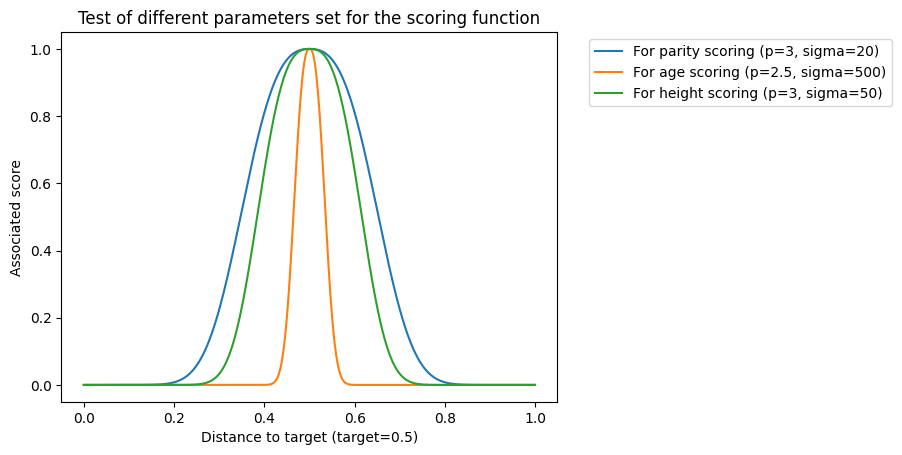

In [75]:
par_p, par_sigma = 3, 20
age_p, age_sigma = 2.5, 500
hei_p, hei_sigma = 3, 50

index      =  [i/1000 for i in range(1000)]
par_function =[srf.scoring_function(i/1000, 0.5, par_p, par_sigma) for i in range(0,1000)]
age_function =[srf.scoring_function(i/1000, 0.5, age_p, age_sigma) for i in range(0,1000)]
hei_function =[srf.scoring_function(i/1000, 0.5, hei_p, hei_sigma) for i in range(0,1000)]
plt.plot(index, par_function, label=f"For parity scoring (p={par_p}, sigma={par_sigma})")
plt.plot(index, age_function, label=f"For age scoring (p={age_p}, sigma={age_sigma})")
plt.plot(index, hei_function, label=f"For height scoring (p={hei_p}, sigma={hei_sigma})")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.title('Test of different parameters set for the scoring function')
plt.xlabel('Distance to target (target=0.5)')
plt.ylabel('Associated score')
plt.show()

#### New dataset

In order to conduct this new analysis, we have to filter once more our dataset.
We first try to rescue the maximal number of values that are not correctly reported in our dataset (for instance, actor age at movie release considering their date of birth and the date of release of the movie).
We then basically get rid of all NaN in each of the categories that we want to score.
Finally, since some castings are clearly partial (some movies have only one or two actors that are descibed in our dataset), so we dropped all rows of films where there were less than 5 actors.



In [76]:
PATH_IMPORTED_DATASET = '.\DATA\MovieSummaries\characterDF_post_filtering'
noNaN_characterDF = pd.read_csv(PATH_IMPORTED_DATASET)
display(noNaN_characterDF)

,Wikipedia movie ID,Freebase movie ID,Movie release date,Character Name,Actor DOB,Actor gender,Actor height,Actor ethnicity,Actor Name,Actor age at movie release,Freebase character map,Ethnicity,Movie genres
0,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,NaN,"['Thriller', 'Science Fiction', 'Horror', 'Adv..."
1,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,NaN,"['Thriller', 'Science Fiction', 'Horror', 'Adv..."
2,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,African Americans,"['Thriller', 'Science Fiction', 'Horror', 'Adv..."
3,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,NaN,"['Thriller', 'Science Fiction', 'Horror', 'Adv..."
4,975900,/m/03vyhn,2001-08-24 00:00:00+00:00,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,NaN,"['Thriller', 'Science Fiction', 'Horror', 'Adv..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71279,5242523,/m/0d9mdg,1943-06-24 00:00:00+00:00,NaN,1893-10-15 00:00:00+00:00,F,1.630,NaN,Ina Claire,49.0,/m/0gc7gfv,NaN,"['Romance Film', 'Musical', 'Black-and-white',..."
71280,2949735,/m/08fm2t,1951-10-19 00:00:00+00:00,NaN,1886-10-17 00:00:00+00:00,F,1.600,NaN,Spring Byington,65.0,/m/0cg8ttq,NaN,"['Sports', 'Family Film', 'Fantasy', 'Comedy']"
71281,6782517,/m/0gnn70,1970-06-24 00:00:00+00:00,Leticia Van Allen,1893-08-17 00:00:00+00:00,F,1.524,/m/041rx,Mae West,76.0,/m/02tb6zf,Jewish people,"['LGBT', 'Parody', 'Sex comedy', 'Gay Interest..."
71282,4110259,/m/0bjnh8,1968-12-22 00:00:00+00:00,NaN,1895-08-13 00:00:00+00:00,M,1.750,/m/041rx,Bert Lahr,73.0,/m/0cg01jx,Jewish people,['Comedy']


In [77]:
#Reference for USA
PATH = 'DATA/real_data/'

#Loading dataset concerning age and hieght distributions in the US and processing data
ages = pd.read_excel(PATH +'Distribution_ages_usa.xlsx')
heights = pd.read_excel(PATH +'Distribution_heights_usa.xlsx', sheet_name = 'Final version results only')

prop_F = 100/198.1 # for 100 women, there are 98.1 men
prop_M = 1- prop_F

ages_np_M = np.array(ages[('MALES')])[:-1]/100
ages_np_F = np.array(ages[('FEMALES')])[:-1]/100

heights_np_M = np.array(heights[('FEMALES')])[:-1]
heights_np_F = np.array(heights[('FEMALES')])[:-1]

# Construction of the reference dictionnary for the US
usa_ref = {}
usa_ref['par']={'F':prop_F, 'M': prop_M}   
usa_ref['age']={'F':ages_np_F, 'M':ages_np_M} # Age_min, Age_max, % of men, % of women
usa_ref['AGE']=usa_ref['age']
usa_ref['hei']={'F':heights_np_F,'M':heights_np_M} # Age_min, Age_max, % of men, % of women
usa_ref['HEI']=usa_ref['hei']
usa_ref['div']=None


function_dic={'par':srf.parity_score,
              'div':srf.diversity_score,
              'AGE':srf.age_score,
              'age':srf.rescued_age_score,
              'HEI':srf.height_score,
              'hei':srf.rescued_height_score,
              'tot':srf.representativeness_score}

### 4.1 Definition of parity score

1.	For the **parity** score, we want to emphasize the fact that pools of movies that have a women proportion under 1/4 or over 3/4 should be strongly penalized. Indeed, parity an critical characteristic of human society. If that proportion gets close to 50%, the score rises rapidly to values close to 1. Also, the score should be symmetric in men and women, i.e. a pool with a proportion *p* of females should get the same score as a pool with proportion *1-p*.

In [78]:
#Test datasets
P0 = pd.DataFrame({"Actor gender":['F','M']}) #Parity. Expect 1
P1 = pd.DataFrame({"Actor gender":['F']}) # Only women. Expect almost 0
P2 = pd.DataFrame({"Actor gender":['M']}) # Only men. Expect almost 0
P3 = pd.DataFrame({"Actor gender":['F','M', 'M']}) # 33% women, expect about 0.5
P4 = pd.DataFrame({"Actor gender":['F','M', 'M','M']}) # 25% women, expect about 0.1


print("Parity score verification:\n")
print(f"For P0 : the score is {srf.parity_score(P0, usa_ref['par'])['par']}, "+
      f"and the proportion of women is {P0['Actor gender'].apply(lambda x: x=='F').mean()}")
print(f"For P1 : the score is {srf.parity_score(P1,usa_ref['par'])['par']}, "+
      f"and the proportion of women is {P1['Actor gender'].apply(lambda x: x=='F').mean()}")
print(f"For P2 : the score is {srf.parity_score(P2,usa_ref['par'])['par']}, "+
      f"and the proportion of women is {P2['Actor gender'].apply(lambda x: x=='F').mean()}")
print(f"For P3 : the score is {srf.parity_score(P3,usa_ref['par'])['par']}, "+
      f"and the proportion of women is {P3['Actor gender'].apply(lambda x: x=='F').mean()}")
print(f"For P4 : the score is {srf.parity_score(P4,usa_ref['par'])['par']}, "+
      f"and the proportion of women is {P4['Actor gender'].apply(lambda x: x=='F').mean()}")

Parity score verification:

For P0 : the score is 0.9998688711716719, and the proportion of women is 0.5
For P1 : the score is 5.490547859849697e-11, and the proportion of women is 1.0
For P2 : the score is 0, and the proportion of women is 0.0
For P3 : the score is 0.3831876857931685, and the proportion of women is 0.3333333333333333
For P4 : the score is 0.04936504809996504, and the proportion of women is 0.25


Parameters that we have found for the parity gaussian are satisfying: $p = 3$ and $\sigma = 20$, as we can see above.

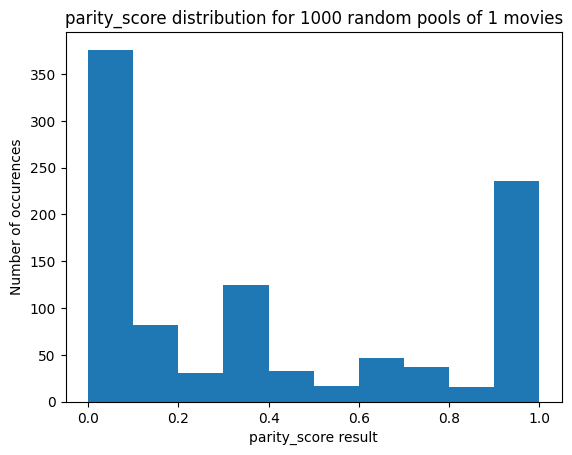

============ Function parity_score ============
The min score is 0 and the max is 0.9999.





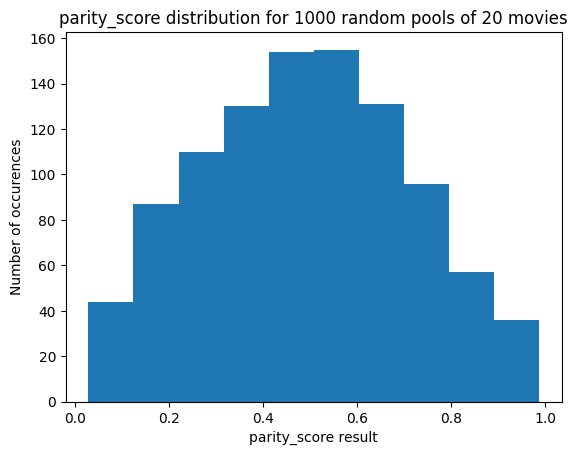

============ Function parity_score ============
The min score is 0.0289 and the max is 0.9869.





In [79]:
function_id='par'

#Test on a large number of random pools of 1 movie each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=1)

print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")


2.	For the **diversity** score, we wish to attribute great scores to pools of movies that collectively represent as many ethnicities as possible. If the number of different ethnicities among actors is above 75%, a score of 1 is attributed. The score then decreases with this ratio, reaching 0 if it is lower than 25%. This way, we value all ethnicities the same way, and value a form of diversity that is easy to measure.


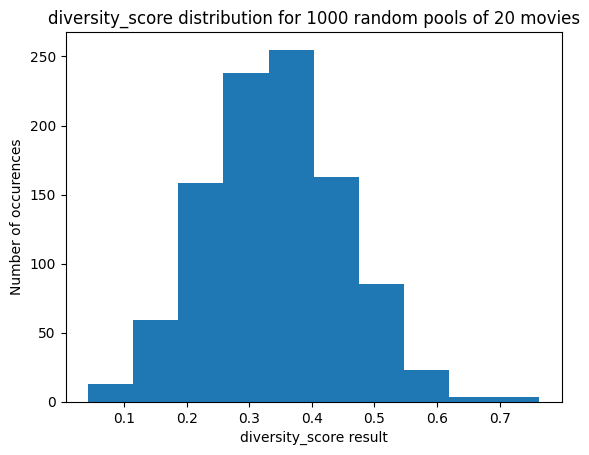

============ Function diversity_score ============
The min score is 0.0424 and the max is 0.7632.





In [80]:
function_id='div'

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

3. For the **age** score, we observe the reference distribution for the United States, and compare our distribution over the actors to the reference one. We choose to penalize equally all misfits. We are likely to observe pools of movies that underrepresent either old or young people. Consequently, a pool that would not underrepresent them too much are way more accurate as regards total population, and deserve good scores.

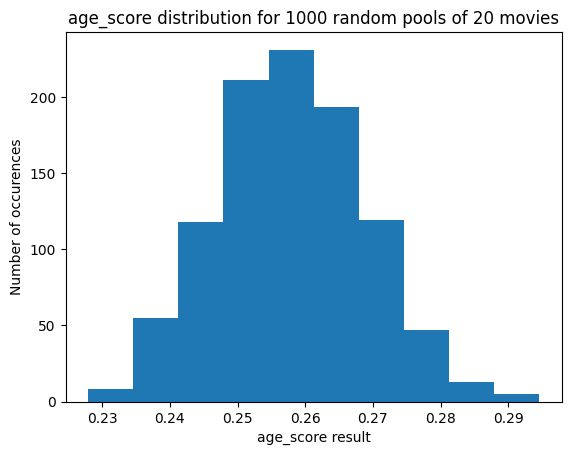

============ Function age_score ============
The min score is 0.2279 and the max is 0.2946.





In [81]:
function_id='AGE'

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

Since the age scoring is not really sqtisfying (not really spread), we descided

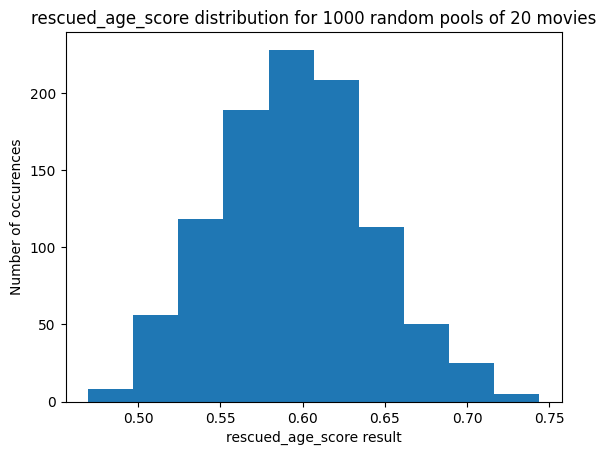

============ Function rescued_age_score ============
The min score is 0.4696 and the max is 0.7438.





In [82]:
function_id='age'

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

4. For the **height** score, we apply the same strategy. Similarly, we choose to penalize equally all misfits. The same conclusions can be drawn.

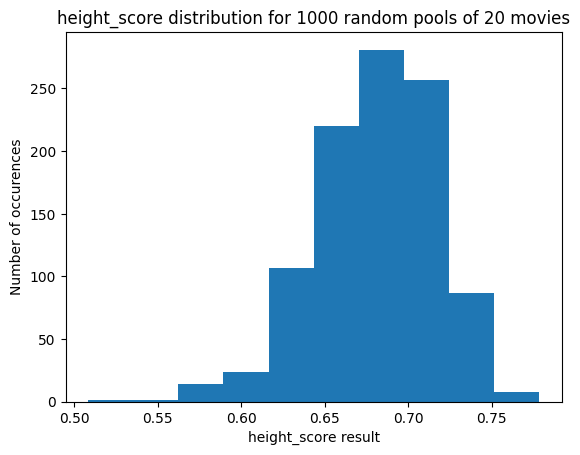

============ Function height_score ============
The min score is 0.5083 and the max is 0.7783.





In [83]:
function_id='HEI'

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

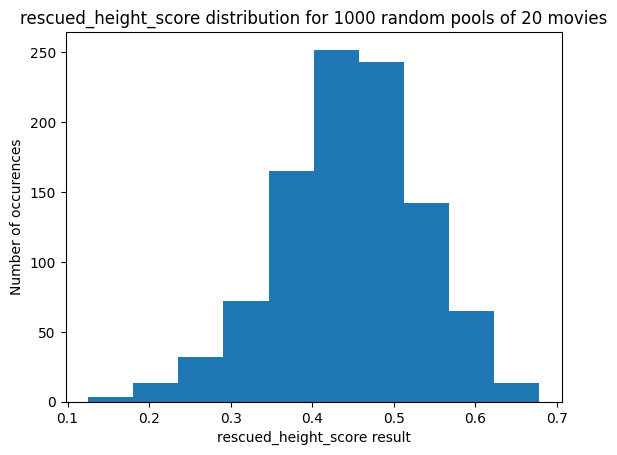

============ Function rescued_height_score ============
The min score is 0.1253 and the max is 0.6782.





In [84]:
function_id='hei'

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

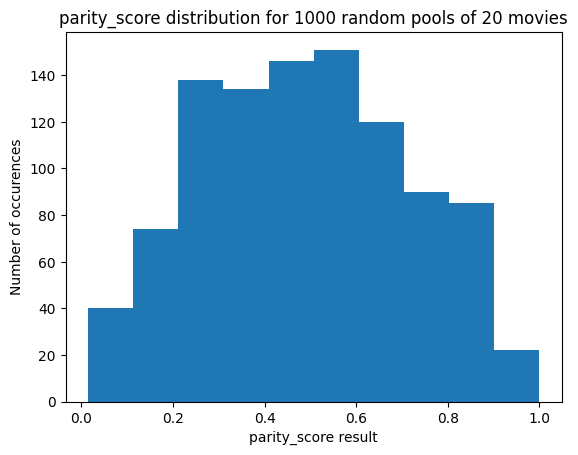

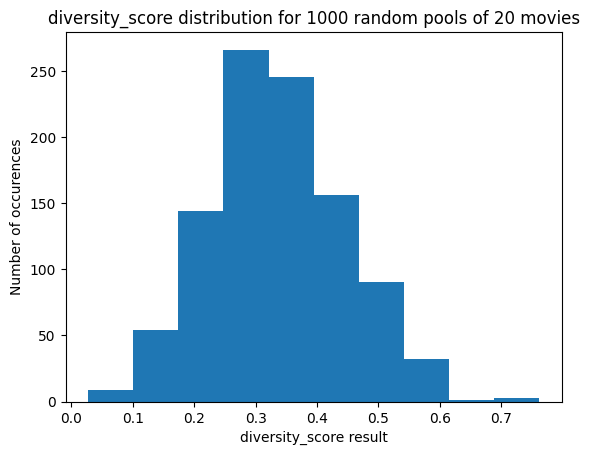

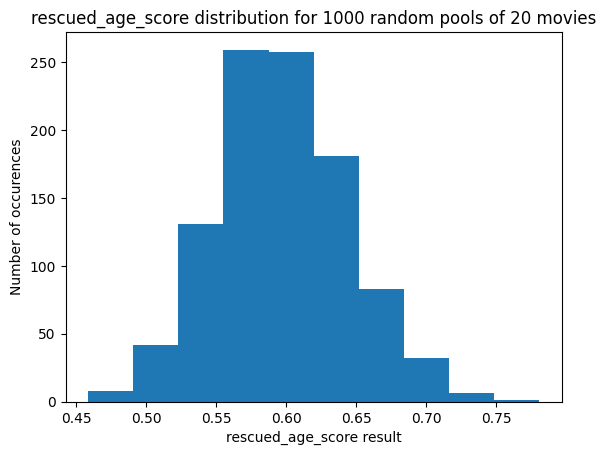

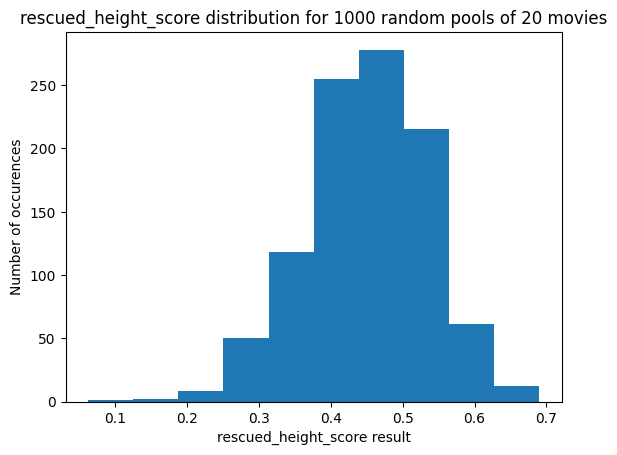

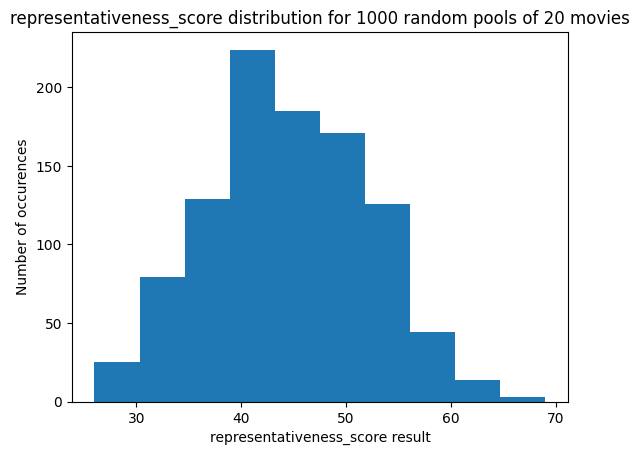

============ Function representativeness_score ============
The min score is 26 and the max is 69.





In [85]:
function_id='tot'

#Test on a large number of random pools of 20 movies each.
score_list = srf.scores_distribution(function_id, noNaN_characterDF, usa_ref, pool_size=20)
# print(score_list)
print(f"============ Function {function_dic[function_id].__name__} ============")
print(f"The min score is {round(min(score_list[function_id]),4)}"+
        f" and the max is {round(max(score_list[function_id]),4)}.")
print(f"===============================================\n\n\n")

## Best pool size

In [111]:
%%capture
POOL_SIZE = 10
THRESHOLD = 50
N_TEST = 10                                          
best_movies_id = []

def distribution_metrics(scores,scale_length=100):
    """
    This function return metrics to see variability in the score distribution.
    
    Inputs :
        @scores : list of scores for n_test pools of pool_size movies
        @scale_length : length of values that the score can take.
        
    Outputs :
        @spread : percentage of the whole scoring length that is effectively used by the distribution
        @avg : average score
        @std : standard deviation of the distribution
    """
    max_score = max(scores)
    min_score = min(scores)
    scores_interval = max_score-min_score
    
    spread = scores_interval/scale_length
    avg = np.mean(np.array(scores))
    std = np.std(np.array(scores))
    return spread, avg, std



In [140]:
pool_size_list=range(1,60,3)
print(pool_size_list)
mean_spread=[] #Hoping to have a high scale occupancy
std_spread=[]  #Hoping to see its variability to be small 

std_avg=[]  #Hoping to have a small variance in mean score 
            #(so that when running a new test on 1000 pools, the mean do not change much)
    
mean_std=[] #Hoping to have a mean standard deviation that is rather high


for pool_size in pool_size_list:
    #print('size = ', pool_size)
    spread_list=[]
    avg_list=[]
    std_list=[]
    for _ in range(10):
        #if _%%5==0:
           #print(f'{_}-th iteration')
        scores = srf.scores_distribution('tot', noNaN_characterDF, usa_ref, n_test=100,
                                     pool_size=pool_size,plot=False)
        spread, avg, std = distribution_metrics(scores['tot'])
        spread_list.append(spread)
        avg_list.append(avg)
        std_list.append(std)
        #print('avg list = ', avg_list)
    mean_spread.append(np.mean(spread_list))
    std_spread.append(np.std(spread_list))
    std_avg.append(np.std(avg_list))
    mean_std.append(np.mean(std_list))


print(std_avg)

range(1, 60, 3)
[1.5989211988087464, 1.1853590173445343, 1.5858511910012236, 0.9179046791470231, 0.6721487930510617, 0.7600289468171586, 0.6584800680354725, 0.7402060523935207, 0.5368659050451989, 0.7646835946978332, 0.6354400050358803, 0.5572800014355443, 0.6136155147973369, 0.4692643178423012, 0.4692430074066101, 0.4210475032582436, 0.22543513479491264, 0.41567294836205154, 0.500635596017701, 0.44137172541974135]


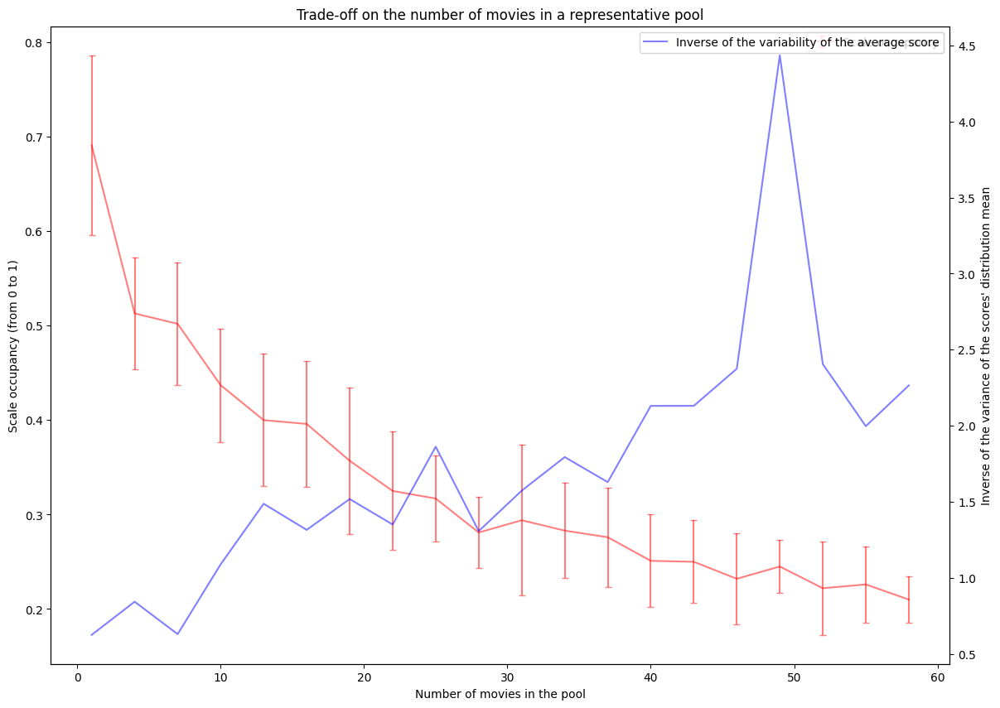

In [141]:
plt.figure(figsize=(14,10))
plt.errorbar(x=pool_size_list, y=mean_spread,yerr=1.96*np.array(std_spread),
              color='r',capsize=3,alpha=0.5, label="Scale occupancy")
plt.xlabel("Number of movies in the pool")
plt.ylabel("Scale occupancy (from 0 to 1)")
#plt.legend(loc=3)
plt.legend()
plt.twinx()
plt.plot(pool_size_list,1/np.array(std_avg),color='b',alpha=0.5, label="Inverse of the variability of the average score")
plt.ylabel("Inverse of the variance of the scores' distribution mean")
plt.legend()
plt.title("Trade-off on the number of movies in a representative pool")
plt.show()

In [89]:
mega_pool = [171559, 4744688, 4939088, 20334086, 33933454, 26057620, 5894429, 320502, 24863901, 27634924,
            17470965, 256713, 28224334, 10771128, 1940449, 24863901, 20334086, 30575, 8309714, 6792375,
            12576817, 20334086, 571383, 1940449, 4459059, 22697314, 8309714, 30575, 5566878, 33933454,
            10771128, 8309714, 5894429, 20334086, 14075290, 1940449, 4459059, 1717731, 33933454, 30462894,
            5566878, 21639537, 9653770, 20334086, 1940449, 14075290, 10771128, 33933454, 5664063, 320502,
            20334086, 24863901, 32832210, 4459059, 1940449, 5894429, 14075290, 5566878, 15670779, 33933454]
actors_pool = srf.defined_movie_pool(mega_pool, noNaN_characterDF)
print(f"The mega pool of {len(mega_pool)} movies (extracted manually) has a score of {srf.representativeness_score(actors_pool, usa_ref)['tot']}.")

The mega pool of 60 movies (extracted manually) has a score of 82.


## Sensitivity

Those are the best pools we got with our empirical method:

In [90]:
final_pool0 = [19845179, 1635059, 2363899, 10780834, 1598832, 9976121,1745419, 1332050, 22565598, 68078,
               17470965, 256713, 28224334, 10771128, 1940449, 24863901, 20334086, 30575, 8309714, 6792375]
final_pool1 = [13439139, 25698427, 2507687, 4360088, 28150124, 24028744, 11929259, 303039, 2231977, 20603201,
               12576817, 20334086, 571383, 1940449, 4459059, 22697314, 8309714, 30575, 5566878, 33933454]
final_pool2 = [768526, 28224334, 12244463, 1131021, 4750927, 27718464, 25901625, 642694, 7680880, 35938622,
               4939088, 17981954, 22747963, 2980843, 30012817, 16958933, 10771128, 22916442, 20334086, 5026441]
final_pool3 = [8495088, 2367208, 6900343, 21211657, 3461278, 23325348, 2363899, 11843126, 1172681, 76630,
               13285237, 26057620, 1829909, 14075290, 23318059, 165106, 20334086, 33933454, 16852170, 217793]
final_pool4 = [2292864, 32291194, 26852809, 779774, 3466113, 766887, 607444, 18410798, 1954484, 21591619,
               4018288, 6302550, 20334086, 33933454, 2797638, 1940449, 24863901, 580994, 30462894, 29585091]
final_pool5 = [5006061, 571383, 617063, 17671802, 16852170, 17365387, 443011, 13610284, 461353, 3954298,
               1531473, 22916442, 5664063, 14075290, 8309714, 20334086, 33933454, 19115982, 16958933, 1940449]
final_pool6 = [1470810, 7902455, 5243359, 10048256, 11048780, 11036762, 5118135, 431562, 4018288, 33410925,
               20334086, 24863901, 32832210, 4459059, 1940449, 5894429, 14075290, 5566878, 15670779, 33933454]
final_pool7 = [23243012, 62668, 2184642, 35527324, 8425973, 4922371, 2563837, 12009929, 13779507, 591310,
               5566878, 21639537, 9653770, 20334086, 1940449, 14075290, 10771128, 33933454, 5664063]
final_pool8 = [483745, 3788150, 17789399, 5230818, 7432079, 8246088, 1599839, 3414692, 4294005, 2964227, 
               10771128, 8309714, 5894429, 20334086, 14075290, 1940449, 4459059, 1717731, 33933454, 30462894]
final_pool9 = [19890229, 2581365, 73412, 161897, 3779953, 25829166, 1717731, 3037946, 4299492, 1745413,
               8940771, 14075290, 10771128, 20334086, 8309714, 30575, 571383, 4459059, 320502, 5664063]
final_pool10 = [5071341, 8388013, 6742643, 5496661, 1367413, 15809123, 14644393, 133622, 5897288, 25359124,
                171559, 4744688, 4939088, 20334086, 33933454, 26057620, 5894429, 320502, 24863901, 27634924]

best10 = [final_pool0,final_pool1,final_pool2,final_pool3, final_pool4,final_pool5,
          final_pool6,final_pool7,final_pool8,final_pool9,final_pool10]

In [91]:
scores_dic=srf.scores_distribution('tot', noNaN_characterDF, usa_ref,pool_size=20,n_test=10000,plot=False)
pools =pd.DataFrame(scores_dic)
column_mapping = {'par': 'parity score', 'age': 'age score', 'hei': 'height score', 'div': 'diversity score', 'tot': 'total score'}
scores_names = np.array(['parity score', 'diversity score', 'age score','height score'])
pools.rename(columns=column_mapping, inplace=True)
display(pools)

,pool,parity score,diversity score,age score,height score,total score
0,"[5845807, 25751187, 8737659, 25657155, 3151407...",0.338218,0.414894,0.631668,0.478027,43
1,"[13434142, 12995295, 27645834, 944471, 154956,...",0.226337,0.204545,0.610487,0.457261,32
2,"[1856550, 2266288, 17089501, 583273, 42361, 66...",0.308890,0.532258,0.677266,0.567734,48
3,"[7102059, 2886036, 8437284, 6855079, 1223386, ...",0.762739,0.286517,0.593452,0.375719,51
4,"[6121312, 1072763, 18138846, 31919884, 5416943...",0.935892,0.339506,0.536578,0.226512,55
...,...,...,...,...,...,...
9995,"[216072, 2168783, 31063484, 4588632, 604150, 9...",0.426606,0.369565,0.569221,0.564806,45
9996,"[1128108, 9088886, 21819410, 21206525, 7306824...",0.480896,0.154545,0.681198,0.430682,39
9997,"[2623071, 30884495, 23836054, 26518860, 204507...",0.609737,0.419540,0.698903,0.469219,53
9998,"[10216667, 22314952, 31276579, 9776999, 600320...",0.569925,0.140777,0.556564,0.407525,39


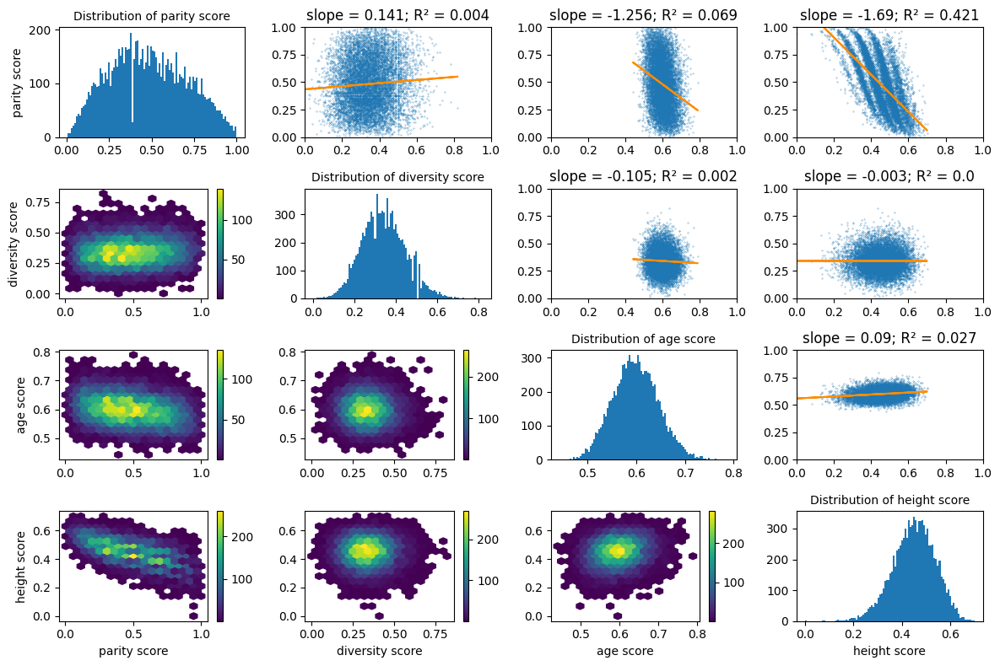

In [92]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 8))

axes = axes.flatten()

for i in range(4):
    axes[i*5].hist(pools[scores_names[i]], bins=100)
    axes[i*5].set_title(f'Distribution of {scores_names[i]}', fontsize = 10)
    if i==0:
        axes[i*5].set_ylabel('parity score')
    if i==3:
        axes[i*5].set_xlabel('height score')
    for j in range(i):
        row = scores_names[i]
        column = scores_names[j]
        heatmap = axes[i*4+j].hexbin(pools[scores_names[j]], pools[scores_names[i]], gridsize=18, mincnt=1)
        cbar = fig.colorbar(heatmap, ax=axes[i*4+j])
        if i==3:
            axes[i*4+j].set_xlabel(f'{scores_names[j]}')
        if j==0:
            axes[i*4+j].set_ylabel(f'{scores_names[i]}')
        slope, intercept, r_value, p_value, std_err = linregress(pools[scores_names[i]], pools[scores_names[j]])
        axes[i+4*j].scatter(pools[scores_names[i]], pools[scores_names[j]], marker='o', s = .05)
        axes[i+4*j].set_xlim(0, 1)
        axes[i+4*j].set_ylim(0, 1)
        regression_line = slope * pools[scores_names[i]] + intercept
        label = 'slope = ' + str(np.round(slope, 3)) + '; R² = ' + str(np.round(r_value**2, 3))
        axes[i+4*j].plot(pools[scores_names[i]], regression_line, color="#FF8C00")
        axes[i+4*j].set_title(label)
        
plt.tight_layout()
plt.show()

In [93]:
# Sensitivity analysis
sensitivity_weights = {'Standard':[2,1,1,2],'All equal':[1,1,1,1], 'Only parity': [1,0,0,0],
                       'Only age':[0,1,0,0], 'Only height':[0,0,1,0], 'Only diversity':[0,0,0,1]}

sensitivity_dic={'Weighting':[key for key in sensitivity_weights]}

for i in range(len(best10)):
    print(i)
    actors_pool = srf.defined_movie_pool(best10[i], noNaN_characterDF)
    sensitivity_dic[f'Pool {i}'] = []
    for key in sensitivity_weights:
        new_weights = sensitivity_weights[key]
        weights_dic = {'par':new_weights[0], 'age':new_weights[1], 'hei':new_weights[2], 'div':new_weights[3]}
        sensitivity_dic[f'Pool {i}'].append(srf.representativeness_score(actors_pool,usa_ref,
                                                                     weights=weights_dic)['tot'])
        
sensitivityDF = pd.DataFrame(sensitivity_dic)
sensitivityDF_ = sensitivityDF.std(axis=1, numeric_only=True)
sensitivityDF['mean'] = sensitivityDF.mean(axis=1, numeric_only=True)
sensitivityDF['std'] =sensitivityDF_
display(sensitivityDF)

0
1
2
3
4
5
6
7
8
9
10


,Weighting,Pool 0,Pool 1,Pool 2,Pool 3,Pool 4,Pool 5,Pool 6,Pool 7,Pool 8,Pool 9,Pool 10,mean,std
0,Standard,84,82,89,87,88,86,83,85,84,85,85,85.272727,2.101947
1,All equal,76,73,83,80,82,79,74,77,76,77,77,77.636364,3.107176
2,Only parity,99,99,99,99,99,99,99,99,98,99,99,98.909091,0.301511
3,Only age,64,66,82,69,74,72,62,68,68,73,75,70.272727,5.676106
4,Only height,39,28,54,54,56,44,37,42,38,38,35,42.272727,8.934102
5,Only diversity,100,100,100,100,100,100,100,100,100,100,100,100.000000,0.000000


# Does the genre influence representativeness?

In [94]:
top_genres = ['Drama', 'Comedy', 'Thriller', 'Romance Film', 'Action', 'Action/Adventure',
              'Crime Fiction', 'Indie', 'Adventure', 'Family Film']
top_genres_by_pool = pd.DataFrame(columns = top_genres)
features = pd.DataFrame(columns = ['mean height', 'std height', 'mean age', 'std age', 'mean parity'])
for i in range(len(pools)):
    if i%10000==0:
        print('i =', i)
    pool = pools.iloc[i]['pool']
    actors = srf.defined_movie_pool(pool.tolist(), noNaN_characterDF)
    heights_ = actors['Actor height'].tolist()
    ages_ = actors['Actor age at movie release'].tolist()
    menratio_ = actors['Actor gender'].tolist()
    h_mean, h_std = np.array(heights_).mean(), np.array(heights_).std()
    a_mean, a_std = np.array(ages_).mean(), np.array(ages_).std()
    ratios = Counter(menratio_)
    p_mean = [float(ratios[word])/len(menratio_) for word in ['M', 'W']][0]
    features_ = np.array([h_mean, h_std, a_mean, a_std, p_mean])
    features.loc[len(features)] = features_
    movies = movieDF[movieDF['Wikipedia movie ID'].isin(pool)]['Movie genres']
    counts = np.zeros(len(top_genres))

    for elem in movies:
        for l in range(len(elem)):
            val = elem[l]
            if val in top_genres:
                counts[top_genres.index(val)] +=1
    counts = counts/20 #20 films per pool
    top_genres_by_pool.loc[len(top_genres_by_pool)] = counts
    
#Merging dataframes to get all features and scores together
pools2 = pd.concat([pools, top_genres_by_pool], axis=1)
pools3 = pd.concat([pools2, features], axis=1)

i = 0


In [95]:
# Keeping X with all the features and y with only the total scores
X = pools3.drop(['total score', 'parity score', 'height score', 'age score', 'diversity score', 'pool'], axis=1)
y = pools3['total score']
display(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Defining the model
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor()
}

,Drama,Comedy,Thriller,Romance Film,Action,Action/Adventure,Crime Fiction,Indie,Adventure,Family Film,mean height,std height,mean age,std age,mean parity
0,0.35,0.30,0.35,0.10,0.30,0.25,0.20,0.05,0.25,0.15,1.772624,0.106119,39.398876,14.610809,0.674157
1,0.55,0.40,0.25,0.15,0.20,0.20,0.15,0.10,0.15,0.20,1.747515,0.116689,38.892655,14.498969,0.694915
2,0.70,0.35,0.15,0.35,0.15,0.10,0.10,0.10,0.00,0.05,1.753396,0.102950,40.094340,14.410335,0.679245
3,0.35,0.60,0.35,0.10,0.30,0.25,0.20,0.10,0.00,0.10,1.733324,0.125989,37.661905,15.082787,0.604762
4,0.45,0.45,0.10,0.50,0.20,0.10,0.00,0.30,0.10,0.15,1.748821,0.102521,35.705202,13.524109,0.560694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.60,0.25,0.30,0.10,0.35,0.30,0.25,0.00,0.20,0.20,1.758741,0.100737,37.931937,13.161525,0.659686
9996,0.45,0.50,0.25,0.30,0.10,0.15,0.10,0.25,0.10,0.05,1.742965,0.127103,40.348837,15.848533,0.651163
9997,0.60,0.40,0.30,0.25,0.20,0.15,0.35,0.15,0.10,0.05,1.752835,0.107397,40.727273,15.966055,0.631016
9998,0.55,0.55,0.20,0.25,0.10,0.00,0.10,0.25,0.05,0.10,1.759303,0.096943,37.958549,14.935035,0.637306


# Results of the machine learning methods

Training Linear Regression...
Linear Regression Mean Squared Error: 14.55235218185452
Training Random Forest...
Random Forest Mean Squared Error: 14.459283200000002


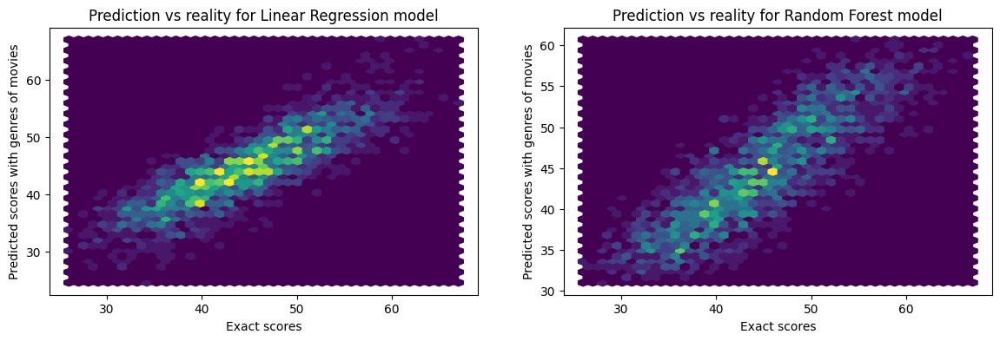

In [96]:
# Evaluating the models and plotting the results

fig, ax = plt.subplots(1, 2, figsize=(14,4))
i=0
for model_name, model in models.items():
    print(f"Training {model_name}...")
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    ax[i].hexbin(y_test, y_pred, label = f'{model_name}', gridsize = 40)
    ax[i].set_xlabel("Exact scores")
    ax[i].set_ylabel("Predicted scores with genres of movies")
    ax[i].set_title(f"Prediction vs reality for {model_name} model")
    i+=1
    mse = mean_squared_error(y_test, y_pred)
    print(f'{model_name} Mean Squared Error: {mse}')

Training Linear Regression...
Linear Regression Mean Squared Error: 15.031720542589468
Training Random Forest...
Random Forest Mean Squared Error: 15.128577949999999


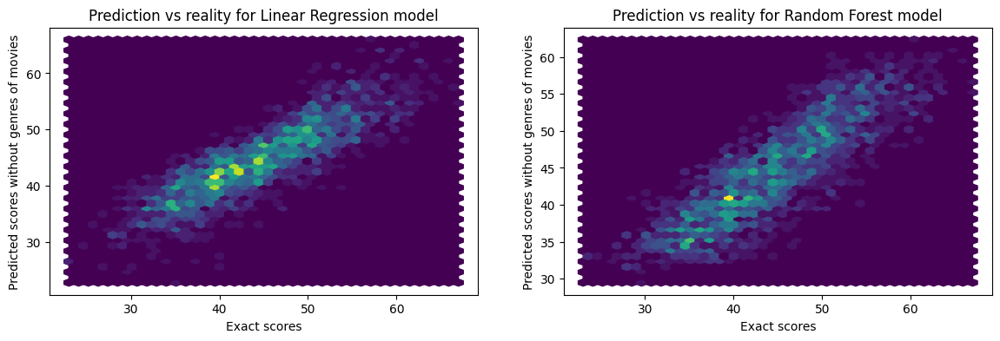

In [97]:
# Removing the features
X = pools3.drop(['total score', 'parity score', 'height score', 'age score', 'diversity score', 'pool'], axis=1)
X2 = X.drop(top_genres, axis = 1)
X2_train, X2_test, y_train, y_test = train_test_split(X2, y, test_size=0.2, random_state=26)

# Evaluating the models and plotting the results

fig, ax = plt.subplots(1, 2, figsize=(14,4))
i=0
for model_name, model in models.items():
    print(f"Training {model_name}...")
    model.fit(X2_train, y_train)
    
    y_pred_nogenres = model.predict(X2_test)
    ax[i].hexbin(y_test, y_pred_nogenres, label = f'{model_name}', gridsize = 40)
    ax[i].set_xlabel("Exact scores")
    ax[i].set_ylabel("Predicted scores without genres of movies")
    ax[i].set_title(f"Prediction vs reality for {model_name} model")
    i+=1
    mse = mean_squared_error(y_test, y_pred_nogenres)
    print(f'{model_name} Mean Squared Error: {mse}')

In [98]:
t_test, p_value = ttest_ind(y_pred, y_pred_nogenres)

In [99]:
print(f'The p-value is {p_value}')

The p-value is 0.7093237159520733


#### T-test

To conclude this analysis on the influence of movie genre in their representativity, adding the knowledge of genres to standard and closely related to the score features do not improve significantly the accuracy of our machine learning model, since the p-value we obtained between both distribution of squared error to the mean is 0.956 (hence clearly above 0.05). So we cannot affirm that geder has a clean influence on representativeness of movies.